In [1]:
import numpy as np
import pandas as pd
import scipy as sp 
import sys 
import string
import random 
import matplotlib.pyplot as plt
import multiprocessing as mp
import pandas as pd
import os
import pickle
import logging

# Importing other functions
import sys
sys.path.append(os.path.join('functions'))
from gamlass_main import *
from utils import *
from model_utils import *

# Setting and importing R functions
import os
os.environ["R_LIBS_USER"] = "/usr/local/lib/R/site-library"


import rpy2.robjects as ro
from rpy2.robjects.packages import importr
# Load the necessary R packages
gamlss = importr('gamlss')
base = importr('base')


# Auto-reload to reflect the real-time changes - quite useful for development of functions
%reload_ext autoreload
%autoreload 2


### To remove unneccesary warning messages
# import warnings
# warnings.filterwarnings("ignore")

from rpy2.rinterface_lib.callbacks import logger as rpy2_logger
import logging
rpy2_logger.setLevel(logging.ERROR)


#### Dataset Description:
=> Please look at the format you need to arrange the input train and test dataset <br>

**Input Dataset Arrangement:**

- The training dataset should have columns: 'site', 'sex', 'age', and the rest of the features. <br>
- The testing dataset should have an additional column called 'affected', which indicates the health status of each sample. The 'affected' column should have values like 'None' for healthy individuals and other morbidities such as 'Schizo', 'Dementia', and 'MDD'.

In [2]:
import numpy as np
import pandas as pd
import random
import string

# Function to generate random site ID
def generate_random_site_id(length, seed):
    random.seed(seed)
    letters = string.ascii_uppercase
    return ''.join(random.choice(letters) for _ in range(length))

# Generate train dataset
np.random.seed(42)
n_train = 1000
train_sites_seeds = [1, 2, 3, 4, 5]  # Fixed seeds for reproducibility
train_sites = [generate_random_site_id(5, seed) for seed in train_sites_seeds]
age_train = np.random.randint(18, 80, n_train)
sex_train = np.random.choice([0, 1], size=n_train)
feature_volume_train1 = np.random.uniform(800, 1200, n_train)
feature_volume_train2 = np.random.uniform(800, 1200, n_train)
feature_volume_train3 = np.random.uniform(800, 1200, n_train)
feature_volume_train4 = np.random.uniform(800, 1200, n_train)
feature_volume_train5 = np.random.uniform(800, 1200, n_train)
y_thickness_train1 = 2 + 0.05 * age_train + 0.01 * feature_volume_train1 + 0.1 * sex_train + np.random.normal(0, 0.1, n_train)
y_thickness_train2 = 2 + 0.05 * age_train + 0.01 * feature_volume_train2 + 0.1 * sex_train + np.random.normal(0, 0.1, n_train)
y_thickness_train3 = 2 + 0.05 * age_train + 0.01 * feature_volume_train3 + 0.01 * feature_volume_train4 + 0.1 * sex_train + np.random.normal(0, 0.1, n_train)
y_thickness_train4 = 2 + 0.05 * age_train + 0.01 * feature_volume_train5 + 0.1 * sex_train + np.random.normal(0, 0.1, n_train)

train_data = {
    'site': np.random.choice(train_sites, size=n_train),
    'sex': sex_train,
    'age': age_train,
    'feature_volume1': feature_volume_train1,
    'feature_volume2': feature_volume_train2,
    'feature_volume3': feature_volume_train3,
    'feature_volume4': feature_volume_train4,
    'feature_volume5': feature_volume_train5,
    'y_thickness1': y_thickness_train1,
    'y_thickness2': y_thickness_train2,
    'y_thickness3': y_thickness_train3,
    'y_thickness4': y_thickness_train4
}
train_data = pd.DataFrame(train_data)

# Generate test dataset
n_test = 500
morbidity_size = 100
test_sites_seeds = train_sites_seeds + [6, 7, 8]  # Additional fixed seeds for test sites
test_sites = [generate_random_site_id(5, seed) for seed in test_sites_seeds]
age_test = np.random.randint(18, 80, n_test)
sex_test = np.random.choice([0, 1], size=n_test)
feature_volume_test1 = np.random.uniform(800, 1200, n_test)
feature_volume_test2 = np.random.uniform(800, 1200, n_test)
feature_volume_test3 = np.random.uniform(800, 1200, n_test)
feature_volume_test4 = np.random.uniform(800, 1200, n_test)
feature_volume_test5 = np.random.uniform(800, 1200, n_test)
y_thickness_test1 = 2 + 0.05 * age_test + 0.01 * feature_volume_test1 + 0.1 * sex_test + np.random.normal(0, 0.1, n_test)
y_thickness_test2 = 2 + 0.05 * age_test + 0.01 * feature_volume_test2 + 0.1 * sex_test + np.random.normal(0, 0.1, n_test)
y_thickness_test3 = 2 + 0.05 * age_test + 0.01 * feature_volume_test3 + 0.01 * feature_volume_test4 + 0.1 * sex_test + np.random.normal(0, 0.1, n_test)
y_thickness_test4 = 2 + 0.05 * age_test + 0.01 * feature_volume_test5 + 0.1 * sex_test + np.random.normal(0, 0.1, n_test)

# Add outliers to the test data
outlier_indices = np.random.choice(n_test, size=morbidity_size, replace=False)
y_thickness_test1[outlier_indices[:(morbidity_size//4)]] += np.random.normal(3, 0.05, morbidity_size//4)  # Positive outliers for y_thickness1
y_thickness_test1[outlier_indices[(morbidity_size//4):(morbidity_size//2)]] -= np.random.normal(3, 0.05, morbidity_size//4)  # Negative outliers for y_thickness1
y_thickness_test2[outlier_indices[(morbidity_size//2):(3*morbidity_size//4)]] += np.random.normal(3, 0.05, morbidity_size//4)  # Positive outliers for y_thickness2
y_thickness_test2[outlier_indices[(3*morbidity_size//4):]] -= np.random.normal(3, 0.05, morbidity_size//4)  # Negative outliers for y_thickness2

morbidities = ['None', 'Schizo', 'Dementia', 'MDD']
affected_test = np.full(n_test, 'None', dtype=object)
affected_test[outlier_indices] = np.random.choice(morbidities[1:], size=morbidity_size)  # Assign morbidities only to outliers

test_data = {
    'site': np.random.choice(test_sites, size=n_test),
    'sex': sex_test,
    'age': age_test,
    'feature_volume1': feature_volume_test1,
    'feature_volume2': feature_volume_test2,
    'feature_volume3': feature_volume_test3,
    'feature_volume4': feature_volume_test4,
    'feature_volume5': feature_volume_test5,
    'y_thickness1': y_thickness_test1,
    'y_thickness2': y_thickness_test2,
    'y_thickness3': y_thickness_test3,
    'y_thickness4': y_thickness_test4,
    'affected': affected_test
}
test_data = pd.DataFrame(test_data)

# Print the datasets
print("Training Dataset:")
display(train_data.head())
print("\nTesting Dataset:")
display(test_data.head())


Training Dataset:


,site,sex,age,feature_volume1,feature_volume2,feature_volume3,feature_volume4,feature_volume5,y_thickness1,y_thickness2,y_thickness3,y_thickness4
0,HJDXM,0,56,848.209032,1019.328233,942.341904,844.454859,1171.438753,13.193791,15.102722,22.705075,16.346387
1,BCCLF,0,69,1092.409469,851.195283,833.567814,1059.242014,1095.497404,16.270048,14.140153,24.329410,16.279542
2,ESZYC,1,46,877.039611,1152.854246,933.385037,1150.047218,922.507155,13.181850,15.957770,25.252397,13.817409
3,BCCLF,0,32,846.112808,957.379139,1071.016378,1116.208204,906.032514,12.079206,13.249307,25.614067,12.729557
4,HSREL,0,60,968.705064,1131.147350,828.844437,856.443038,1078.476980,14.677013,16.338447,21.770908,15.647700



Testing Dataset:


,site,sex,age,feature_volume1,feature_volume2,feature_volume3,feature_volume4,feature_volume5,y_thickness1,y_thickness2,y_thickness3,y_thickness4,affected
0,BCCLF,0,30,1023.903397,848.225798,826.236346,829.913302,1012.805391,13.702123,11.902975,20.071977,13.518398,None
1,HJDXM,0,31,943.319765,847.976074,1082.031971,1166.870174,964.376733,16.094294,12.021493,25.992028,13.367153,Schizo
2,KEMUB,0,61,834.336911,1090.357464,1017.414439,1096.616055,1040.821469,13.418382,15.955251,26.191687,15.535178,None
3,HJDXM,0,57,1091.966252,1027.887763,1010.311723,934.196882,1053.981485,15.740174,15.121369,24.188632,15.713362,None
4,TIXLZ,0,70,1148.455260,1013.496792,916.818223,945.175512,817.113312,16.870380,15.617865,24.129150,13.600990,None


#### Data Pre processing
- Validate that your testing data 'site' column is a subset of the training data 'site' column. 

In [3]:
check_test_sites(train_data, test_data)

Number of unique sites in the training set: 5
Number of unique sites in the test set: 8
Test sites not present in the training set: ['HLMEG', 'KEMUB', 'ZSCPY']
Number of extra sites: 3


,site,Length,Healthy,Morbidities
0,HLMEG,69,58,"Len: 11, ['MDD', 'Schizo', 'Dementia']"
1,KEMUB,58,47,"Len: 11, ['Schizo', 'MDD', 'Dementia']"
2,ZSCPY,59,51,"Len: 8, ['Schizo', 'Dementia', 'MDD']"


Suggestion: Use 20% of 'None' samples from extra sites in the training data.
This can be done by calling the 'add_extra_site_data' function.


In [4]:
train_data1, test_data1 = add_extra_site_data(train_data, test_data, fraction=0.2)

Extra sites found in the test set: ['HLMEG', 'KEMUB', 'ZSCPY']


In [5]:
check_test_sites(train_data1, test_data1)

Number of unique sites in the training set: 8
Number of unique sites in the test set: 8
No extra sites found in the test set.


In [6]:
# Just a sanity check to make sure the sites in test data are a superset of sites in train data
print(set(train_data1.site.unique()).difference(set(test_data1.site.unique())))
print("If above set is empty means we successfully added extra site data to train data")

set()
If above set is empty means we successfully added extra site data to train data


In [7]:
train_data1.head()

,site,sex,age,feature_volume1,feature_volume2,feature_volume3,feature_volume4,feature_volume5,y_thickness1,y_thickness2,y_thickness3,y_thickness4
0,HJDXM,0,56,848.209032,1019.328233,942.341904,844.454859,1171.438753,13.193791,15.102722,22.705075,16.346387
1,BCCLF,0,69,1092.409469,851.195283,833.567814,1059.242014,1095.497404,16.270048,14.140153,24.329410,16.279542
2,ESZYC,1,46,877.039611,1152.854246,933.385037,1150.047218,922.507155,13.181850,15.957770,25.252397,13.817409
3,BCCLF,0,32,846.112808,957.379139,1071.016378,1116.208204,906.032514,12.079206,13.249307,25.614067,12.729557
4,HSREL,0,60,968.705064,1131.147350,828.844437,856.443038,1078.476980,14.677013,16.338447,21.770908,15.647700


# Column Name Special Character Remover Function

R library might give you errors if your columns have special characters in their names, such as hyphens ("-"), ampersands ("&"), or spaces. Please use the `remove_special_characters` function to modify the column names and replace these special characters with underscores ("_"). For example, change "column-1 & 2" to "column_1_2" for all columns. The function can handle multiple dataframes at once and outputs a list of modified dataframes along with a list of dictionaries which can help access your original names by using the new column name as a key.

Example:
```python
# For a single dataframe
[modified_df], [name_map] = remove_special_characters([df])
original_name = name_map['column_1_2']  # Returns 'column-1 & 2'

# For multiple dataframes
[modified_df1, modified_df2], [name_map1, name_map2] = remove_special_characters([df1, df2])
original_name1 = name_map1['column_1_2']  # Returns 'column-1 & 2' for df1
original_name2 = name_map2['column_1_2']  # Returns 'column-1 & 2' for df2

### Fitting models

In [8]:
#### To know all parameters of GAMLSS model, please uncomment the below line and run it, it will guide you through all the parameters
# help_function = robjects.r('''help(gamlss)''')
# print(help_function)

In [9]:
# train_data1.to_csv('../extra_files/train_data1.csv', index=False)
# test_data1.to_csv('../extra_files/test_data1.csv', index=False)

train_data1 = pd.read_csv('../extra_files/train_data1.csv')
test_data1 = pd.read_csv('../extra_files/test_data1.csv')

In [10]:
# Defining x and y variables for GAMLASS
y_val = 'y_thickness1'
x_vals = ['age', 'sex', 'site', 'feature_volume1']
columns = x_vals.copy()
columns.extend([y_val])
# Selecting the columns for the training data
df_train = train_data1.loc[:, columns]

In [11]:

# Create an instance of the Gamlss class
model_name = 'model_shash'
gamlss_model = Gamlss(model_name, x_vals, y_val)

gamlss_model.fit(
    r_code="""
    model <- gamlss(y ~ pb(age, by = as.factor(sex)) + site,
        sigma.formula = ~ pb(age) + site,
        nu.formula = ~ 1,
        tau.formula = ~ 1,
        random = ~ 1|site,
        family = SHASH(),
        method = RS(50)
    )
    """,
    data=df_train
)
# family = SHASH(), GG()
# method = RS(2), CG(10), mixed(2,10)
# "by="  function means separate smoothing term for each sex

GAMLSS-RS iteration 1: Global Deviance = 3533.493 
GAMLSS-RS iteration 2: Global Deviance = 3451.526 
GAMLSS-RS iteration 3: Global Deviance = 3390.881 
GAMLSS-RS iteration 4: Global Deviance = 3344.517 
GAMLSS-RS iteration 5: Global Deviance = 3308.08 
GAMLSS-RS iteration 6: Global Deviance = 3278.846 
GAMLSS-RS iteration 7: Global Deviance = 3255.232 
GAMLSS-RS iteration 8: Global Deviance = 3235.448 
GAMLSS-RS iteration 9: Global Deviance = 3218.944 
GAMLSS-RS iteration 10: Global Deviance = 3204.737 
GAMLSS-RS iteration 11: Global Deviance = 3192.539 
GAMLSS-RS iteration 12: Global Deviance = 3181.854 
GAMLSS-RS iteration 13: Global Deviance = 3172.706 
GAMLSS-RS iteration 14: Global Deviance = 3164.594 
GAMLSS-RS iteration 15: Global Deviance = 3157.416 
GAMLSS-RS iteration 16: Global Deviance = 3150.942 
GAMLSS-RS iteration 17: Global Deviance = 3145.066 
GAMLSS-RS iteration 18: Global Deviance = 3139.847 
GAMLSS-RS iteration 19: Global Deviance = 3135.117 
GAMLSS-RS iteration 20

#### Saving and loading models

In [12]:
# Save the model
gamlss_model.save_model("../results/saving_model.rds")

Model saved to ../results/saving_model.rds


In [13]:
# Later, you can load the model:
loaded_model = Gamlss.load_model("../results/saving_model.rds")

Model 'model_shash' loaded from ../results/saving_model.rds


#### Other functionalities

In [14]:
# Summary for the above fitted model: Details in Notion documentation
model_summary = base.summary(robjects.r[model_name])
print(model_summary)

******************************************************************
Family:  c("SHASH", "Sinh-Arcsinh") 

Call:  gamlss(formula = y_thickness1 ~ pb(age, by = as.factor(sex)) +  
    site, sigma.formula = ~pb(age) + site, nu.formula = ~1, tau.formula = ~1,  
    family = SHASH(), data = model_shash_traindata, method = RS(50),  
    random = ~1 | site) 

Fitting method: RS(50) 

------------------------------------------------------------------
Mu link function:  identity
Mu Coefficients:
                              Estimate Std. Error t value Pr(>|t|)    
(Intercept)                  11.892543   0.116606 101.989   <2e-16 ***
pb(age, by = as.factor(sex))  0.052196   0.001868  27.939   <2e-16 ***
siteESZYC                    -0.011710   0.106748  -0.110    0.913    
siteHJDXM                    -0.014950   0.100300  -0.149    0.882    
siteHLMEG                     0.382768   0.345341   1.108    0.268    
siteHSREL                    -0.041753   0.105032  -0.398    0.691    
siteKEMUB   

In [15]:
# Testing on the test dataset
df_test = test_data1.loc[:, columns]
predictions = gamlss_model.predict_all(df_test,df_train, transform=True, verbose=False)
predictions

,mu_pred,sigma_pred,nu_pred,tau_pred
1,13.459885,2.748366,2.135793,2.104253
2,13.497103,2.630465,2.135793,2.104253
3,15.397382,2.646532,2.135793,2.104253
4,14.853540,2.669534,2.135793,2.104253
5,15.661151,2.850337,2.135793,2.104253
...,...,...,...,...
466,14.252842,2.680223,2.135793,2.104253
467,13.156933,2.774149,2.135793,2.104253
468,14.562620,2.622804,2.135793,2.104253
469,15.535046,2.868841,2.135793,2.104253


In [16]:
predictions.describe()

,mu_pred,sigma_pred,nu_pred,tau_pred
count,470.000000,470.000000,4.700000e+02,4.700000e+02
mean,14.398445,2.713187,2.135793e+00,2.104253e+00
std,0.969537,0.141817,2.311724e-14,1.733793e-14
min,12.594121,2.348547,2.135793e+00,2.104253e+00
25%,13.519239,2.641308,2.135793e+00,2.104253e+00
50%,14.418283,2.733477,2.135793e+00,2.104253e+00
75%,15.191139,2.825630,2.135793e+00,2.104253e+00
max,16.399099,2.919860,2.135793e+00,2.104253e+00


In [17]:
#### --- Just a sanity check ---- #####
### Cheking if the saved model yields the same results
df_test = test_data1.loc[:, columns]
loaded_predictions = loaded_model.predict_all(df_test, df_train, transform=True, verbose=False)
loaded_predictions.describe()


,mu_pred,sigma_pred,nu_pred,tau_pred
count,470.000000,470.000000,4.700000e+02,4.700000e+02
mean,14.398445,2.713187,2.135793e+00,2.104253e+00
std,0.969537,0.141817,2.311724e-14,1.733793e-14
min,12.594121,2.348547,2.135793e+00,2.104253e+00
25%,13.519239,2.641308,2.135793e+00,2.104253e+00
50%,14.418283,2.733477,2.135793e+00,2.104253e+00
75%,15.191139,2.825630,2.135793e+00,2.104253e+00
max,16.399099,2.919860,2.135793e+00,2.104253e+00


##### Diagnostic plot for the model
Detailed explanation in the Notion page

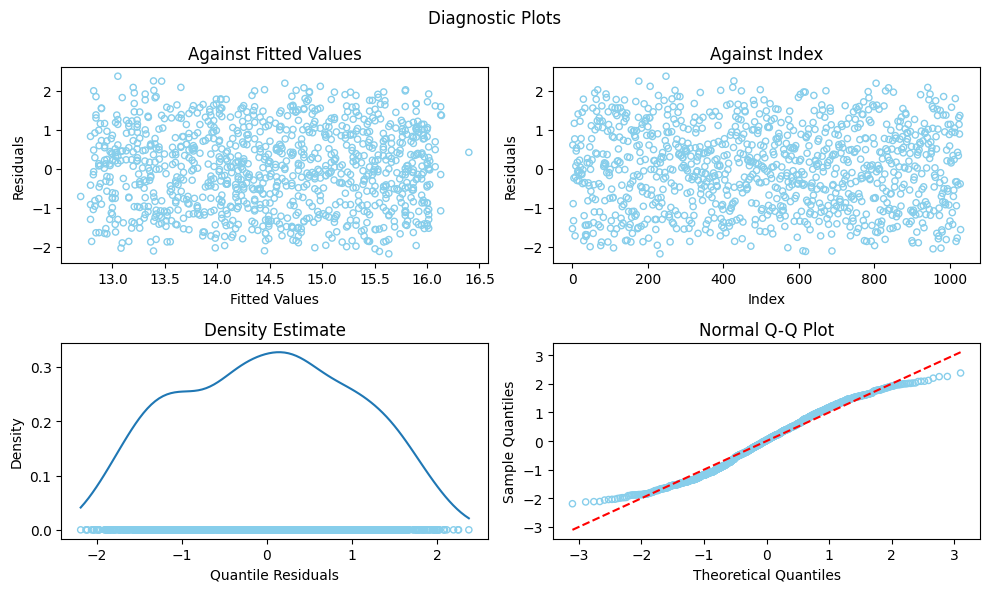

******************************************************************
	      Summary of the Quantile Residuals
                           mean   =  0.004042072 
                       variance   =  1.081486 
               coef. of skewness  =  0.0005663156 
               coef. of kurtosis  =  2.079224 
Filliben correlation coefficient  =  0.9903677 
******************************************************************
2


In [18]:
gamlss_model.plot_diagnostics()

## Z-Scores

### Plotting Z-Scores

The `plot_z_scores` method creates visualizations of standardized scores against age, helping identify outliers and assess value distributions. It generates a single plot showing z-scores, reference percentile lines, and optional affected status highlighting.

#### Method Parameters:

- `test_data` (pandas.DataFrame): DataFrame containing the test data
- `train_data` (pandas.DataFrame): DataFrame containing the training data
- `affected` (numpy.ndarray, optional): Array of binary values indicating affected status
- `func_name` (str): Distribution type (default is 'SHASH')

### Output:

- **Plot**: Generates a single plot showing z-scores against age with reference lines and optional affected status highlighting.
- **Visualization Elements**: Includes scatter points, horizontal reference lines, and optional color-coded markers for affected status.

#### Interpreting the Plot:

- **Z-score Distribution**: Shows how standardized scores vary with age, indicating deviation from the expected values
- **Reference Lines**: Contains three horizontal lines representing critical percentiles:
  - Red dashed lines at z = ±1.96 (2.5th and 97.5th percentiles)
  - Green dashed line at z = 0 (50th percentile/median)
- **Data Points**: 
  - Blue hollow circles represent individual z-scores
  - If affected status is provided, points are color-coded by their status using distinct colors from the 'tab20' colormap
  - Points beyond ±1.96 standard deviations can be considered statistical outliers

#### Notes:

- Point sizes are standardized (s=20 for regular points, s=50 for affected status points)
- The legend is positioned outside the plot area to avoid overlapping with data points
- The visualization helps identify age-related patterns in z-scores and potential systematic deviations from the expected distribution

This z-score plotting functionality provides a valuable tool for assessing the normality of your data and identifying potential outliers or patterns that might require further investigation.

In [19]:
# Calculate Z-scores for the test data
# Function name below will be same as the family name you choose
z_scores = gamlss_model.z_score(df_train,df_train,func_name = 'SHASH')
print('Z-score:', z_scores)


Z-score: [-1.54242     0.60809467 -0.9003639  ...  1.3652702  -0.39090487
 -1.56589728]


In [20]:
df_train = train_data1.loc[:, columns]
loaded_z_scores = loaded_model.z_score(df_train,df_train, func_name = 'SHASH')
print('Loaded Z-score:', loaded_z_scores)

Loaded Z-score: [-1.54242     0.60809467 -0.9003639  ...  1.3652702  -0.39090487
 -1.56589728]


In [21]:
df_train.site.unique()

array(['HJDXM', 'BCCLF', 'ESZYC', 'HSREL', 'TIXLZ', 'KEMUB', 'ZSCPY',
       'HLMEG'], dtype=object)

In [22]:
test_data1['affected']

0         NaN
1      Schizo
2         NaN
3         NaN
4         NaN
        ...  
465       NaN
466    Schizo
467       NaN
468       NaN
469    Schizo
Name: affected, Length: 470, dtype: object

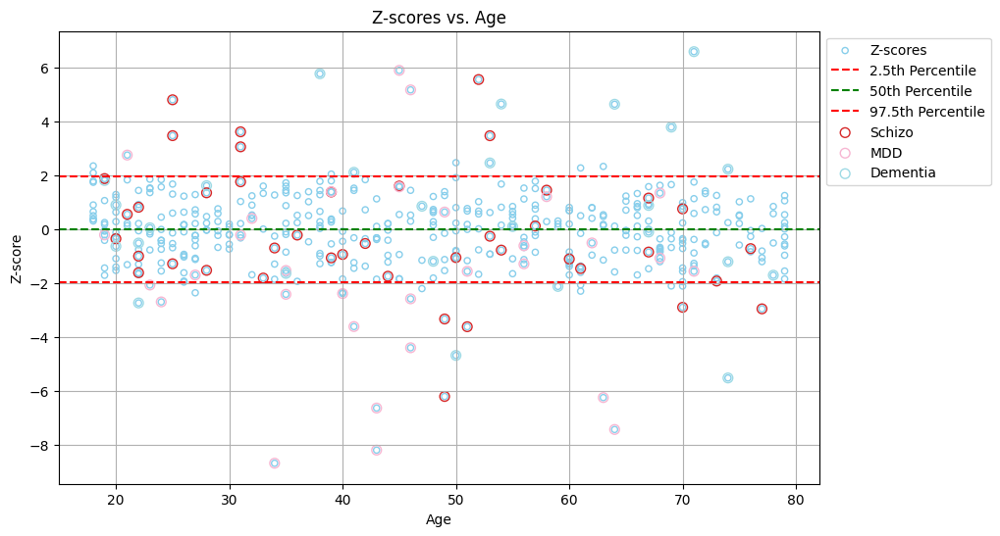

In [23]:
gamlss_model.plot_z_scores(df_test,df_train, func_name = 'SHASH', affected=test_data1['affected'])


In [24]:
# If you want to calculate AIC and BIC, you can use the below code
bic = stats.BIC(robjects.r[model_name])[0]
aic = stats.AIC(robjects.r[model_name])[0]
print(f"AIC: {aic}, BIC: {bic}")

AIC: 3117.8535635440885, BIC: 3216.6232889402268


## Centiles plot


### Plotting Centiles

The `plot_centiles` method in the `Gamlss` class allows you to visualize centile curves for your GAMLSS model. It provides a powerful way to represent the distribution of your target variable across different factors and allows for flexible data subsetting and axis customization.

#### Method Parameters:

- `test_data` (pandas.DataFrame): DataFrame containing the test data.
- `train_data` (pandas.DataFrame): DataFrame containing the training data.
- `centiles` (list): List of centiles to plot (default is [3, 10, 25, 50, 75, 90, 97])
- `func_name` (str): Distribution type (default is 'SHASH')
- `affected` (numpy.ndarray, optional): Array of binary values indicating affected status.
- `variables_to_split` (dict, optional): Dictionary of variables and their values to split the plot by.
- `raw_subset` (bool or str, optional): If False, use all raw data. If a column name is provided, use data from the selected category of that column. (default is False)
- `x_axis` (dict, optional): Dictionary with column name as key and display name as value for x-axis. (default is {'age': 'Age'})



### Output:

- **Plots**: Generates one or more plots depending on the `variables_to_split` parameter.
- **Console Output**: Prints information about the data columns and values used for centile calculations.

#### Interpreting the Plots:

- The centile curves show how the distribution of the target variable changes with the x-axis variable (default is age).
- The scattered points represent actual data, allowing you to see how well the model fits the observed values.
- When split by variables, you can compare how the distribution differs across different groups (e.g., males vs. females).
- The legend indicates which line corresponds to which centile and includes labels for affected status if provided.

#### Notes:

- The method automatically handles categorical and continuous variables when creating the grid for centile calculations.
- The `raw_subset` parameter allows you to plot raw data from a specific category (e.g., a particular site) that was used for centile calculations.
- You can customize the x-axis label and column using the `x_axis` parameter.

This enhanced centile plotting functionality provides a comprehensive and flexible visual tool for assessing your GAMLSS model's performance and understanding the distribution of your target variable across different factors. It allows for easy comparison between different subsets of data and customization of the plot's axes.

In [19]:
# Centile calculation
centile_score = gamlss_model.centiles(df_train,df_train,func_name = 'SHASH', centiles = [3, 10, 25, 50, 75, 90, 97])
# Output is (n_samples, n_centiles)
print(f"Shape of centile scores: {centile_score.shape}")
print(centile_score)

Shape of centile scores: (1030, 7)
[[12.93942537 13.40973358 13.99806846 ... 15.6115739  16.21079102
  16.69138065]
 [13.53397694 14.0292064  14.64871666 ... 16.34772042 16.97868957
  17.48474525]
 [12.30748239 12.80644975 13.43063595 ... 15.14246347 15.77819504
  16.28807033]
 ...
 [14.10611459 14.61940547 15.26150977 ... 17.02247757 17.67645867
  18.2009706 ]
 [13.23816168 13.7466504  14.38274742 ... 16.12724027 16.77510297
  17.29470778]
 [13.49341036 14.00331884 14.6411919  ... 16.39055557 17.04022717
  17.56128277]]


In [20]:
df_train.columns

Index(['age', 'sex', 'site', 'feature_volume1', 'y_thickness1'], dtype='object')

In [22]:
df_train.site

0       HJDXM
1       BCCLF
2       ESZYC
3       BCCLF
4       HSREL
        ...  
1025    HLMEG
1026    HLMEG
1027    HLMEG
1028    HLMEG
1029    HLMEG
Name: site, Length: 1030, dtype: object

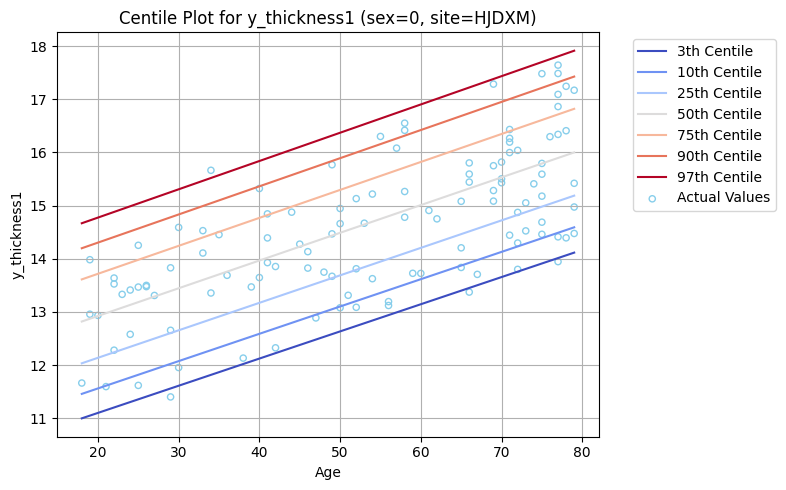

Values used for centile calculation in this plot:
sex: 0
site: HJDXM
feature_volume1: 985.0712735964343


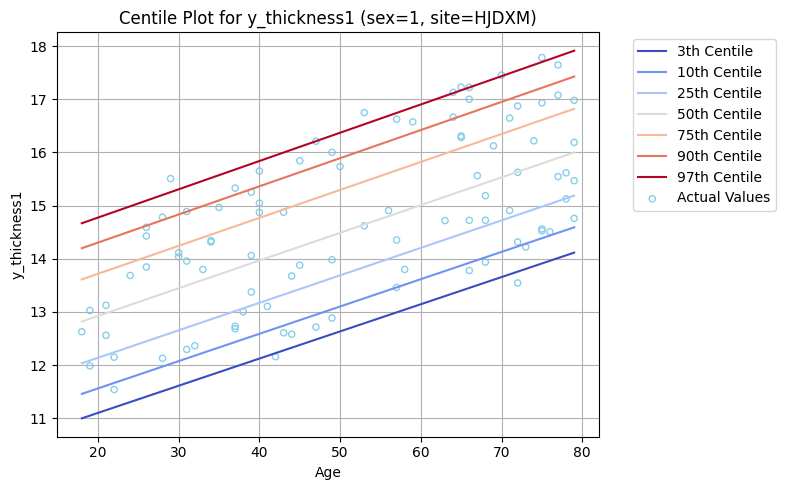

Values used for centile calculation in this plot:
sex: 1
site: HJDXM
feature_volume1: 1004.6234474982706


In [25]:
# Plotting centiles
gamlss_model.plot_centiles(df_train,df_train, func_name = 'SHASH', centiles = [3, 10, 25, 50, 75, 90, 97], 
                            variables_to_split = {'sex': [0, 1], 'site': ['HJDXM']},
                            raw_subset='site', x_axis={'age': 'Age'})

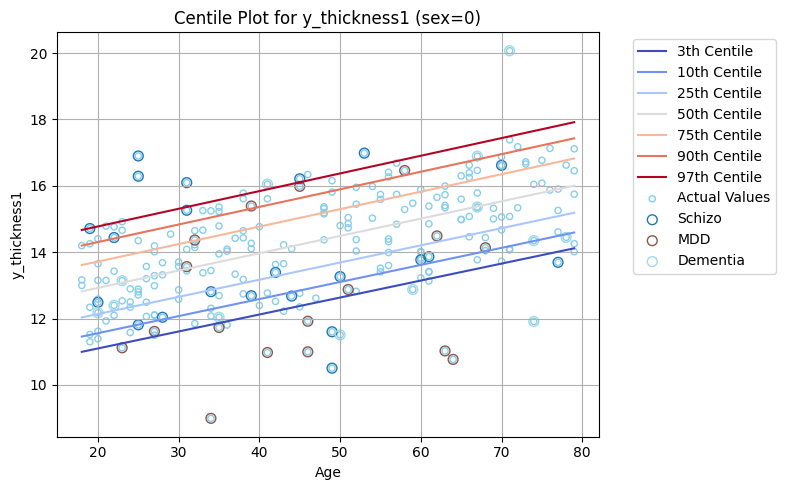

Values used for centile calculation in this plot:
sex: 0
site: HJDXM
feature_volume1: 993.3005569655891


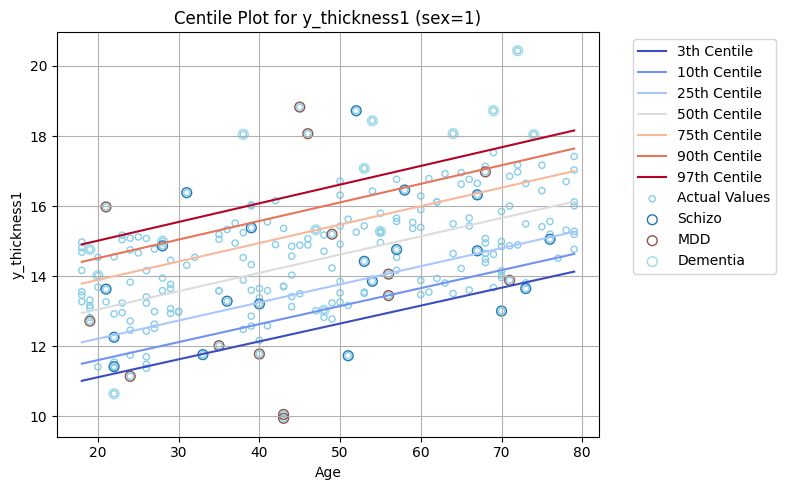

Values used for centile calculation in this plot:
sex: 1
site: TIXLZ
feature_volume1: 1001.0492963841119


In [28]:
# Plotting centiles
gamlss_model.plot_centiles(df_test,df_train, affected=test_data1['affected'],func_name = 'SHASH', 
                            centiles = [3, 10, 25, 50, 75, 90, 97], 
                            variables_to_split = {'sex': [0, 1]},
                            raw_subset=False, x_axis={'age': 'Age'})

### Plotting Continuous Centiles with Uncertainty

The `plot_continuous_centiles` method in the `Gamlss` class provides advanced visualization of centile curves with uncertainty bands. It offers sophisticated capabilities for splitting data across both discrete and continuous variables while visualizing the uncertainty in centile estimates.

#### Method Parameters:

- `test_data` (pandas.DataFrame): DataFrame containing the test data.
- `train_data` (pandas.DataFrame): DataFrame containing the training data.
- `centiles` (list): List of centiles to plot (default is [3, 10, 25, 50, 75, 90, 97])
- `func_name` (str): Distribution type (default is 'SHASH')
- `discrete_split` (dict, optional): Dictionary with column name as key and list of values to split by (e.g., {'sex': [0, 1]})
- `continuous_split` (dict, optional): Dictionary with column name as key and tuple of (display_name, n_splits) as value (e.g., {'bmi': ('BMI', 5)})
- `approximated` (dict, optional): Dictionary of variables with their fixed values to use instead of mean/mode
- `x_axis` (dict, optional): Dictionary with column name as key and display name as value for x-axis (default is {'age': 'Age'})
- `y_axis` (str, optional): Name of y-axis variable (defaults to self.y_val)
- `affected` (numpy.ndarray, optional): Array of binary values indicating affected status

This method extends the basic centile plotting functionality by incorporating uncertainty visualization and support for both discrete and continuous variable splitting. It creates a grid of plots showing how centiles vary across different subgroups while accounting for the uncertainty in the estimates through shaded confidence bands.


### Output:

- **Plots**: Generates a grid of plots showing centile curves with uncertainty bands
- **Console Output**: Prints information about approximated variables and affected status distributions

#### Interpreting the Plots:

- Each plot shows centile curves with shaded regions representing uncertainty (95% CI)
- Scattered points display actual data values, with different colors for affected status if provided
- For continuous splits, the grid shows how centiles change across different ranges of the split variable
- The right y-axis shows the range of the continuous split variable for each row

#### Notes:

- The method automatically handles variable approximation for unmapped columns
- Affected status colors are consistent across all subplots for easy comparison
- Uncertainty bands help visualize the reliability of centile estimates


Variables being approximated:
site: user provided = ESZYC


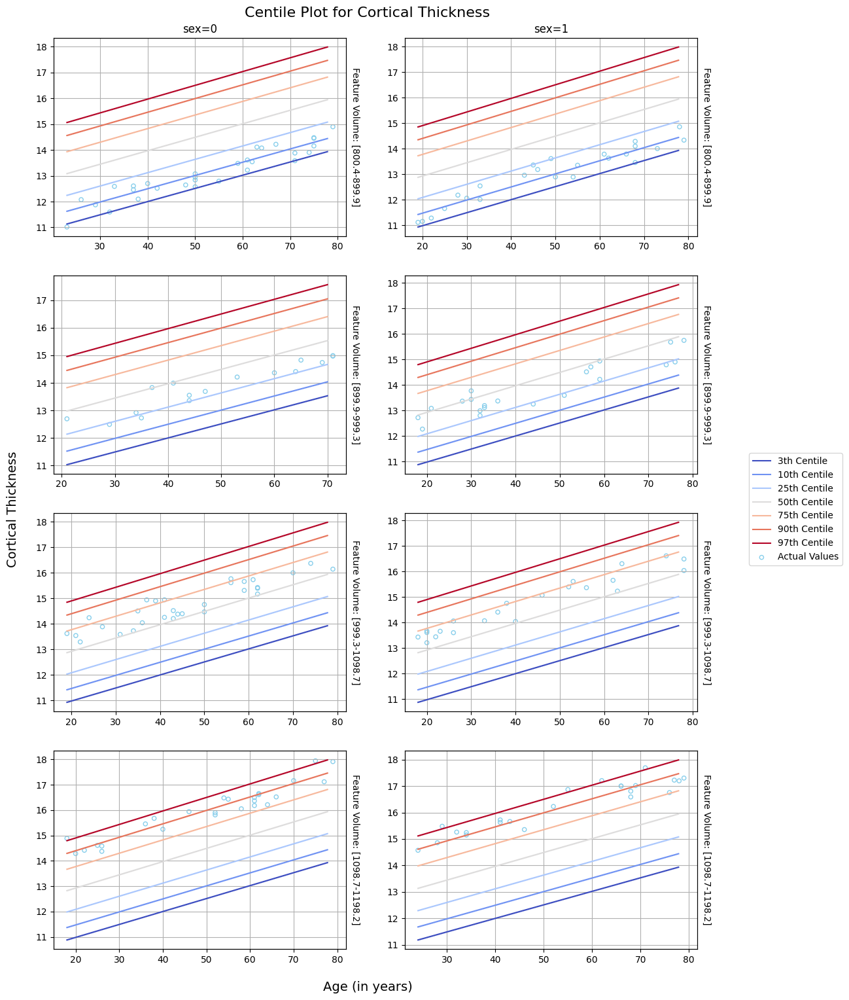

In [43]:
# Plotting centiles
# For training dataset
gamlss_model.plot_continuous_centiles(df_train, df_train, 
                          func_name='SHASH', 
                          centiles=[3, 10, 25, 50, 75, 90, 97], 
                          discrete_split={'sex': [0, 1]}, 
                          continuous_split={'feature_volume1':["Feature Volume", 4]}, 
                          approximated={"site":"ESZYC"}, 
                          x_axis={'age': 'Age (in years)'},
                          y_axis = "Cortical Thickness")

Variables being approximated:
site: user provided = HLMEG
Affected distribution after filtering:
(array(['Dementia', 'MDD', 'None', 'Schizo'], dtype=object), array([ 3,  4, 47,  4]))


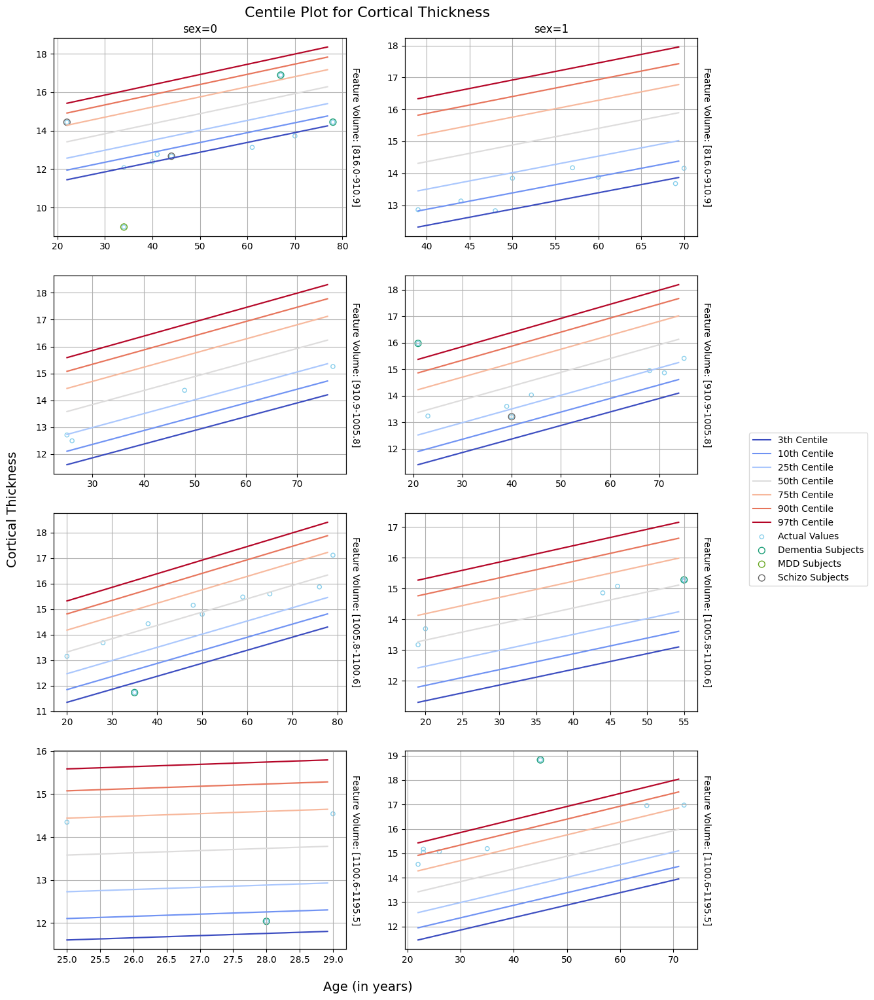

In [44]:
# Plotting centiles
# For test dataset (along with affected)
gamlss_model.plot_continuous_centiles(df_test, df_train, 
                          func_name='SHASH', 
                          centiles=[3, 10, 25, 50, 75, 90, 97], 
                          discrete_split={'sex': [0, 1]}, 
                          continuous_split={'feature_volume1':["Feature Volume", 4]}, 
                          approximated={"site":"HLMEG"}, 
                          x_axis={'age': 'Age (in years)'},
                          y_axis = "Cortical Thickness",
                          affected=test_data1['affected'])

### Running Multiple Formula Models

The `run_multiple_formula_models` function allows you to compare multiple GAMLSS model formulas across different y-values. It supports parallel processing for efficiency.

#### Function Parameters:

- `create_model_func`: Function to create a GAMLSS model
- `y_val_columns`: List of y-value column names to model
- `df_train`: Training dataframe
- `formulas`: List of formula dictionaries (each containing 'mu_formula', 'sigma_formula', 'nu_formula', 'tau_formula')
- `x_vals`: List of predictor variables (default: ['age', 'sex', 'site'])
- `main_folder`: Folder for saving results and logs (default: 'results')
- `save_log`: Whether to save logs (default: True)
- `num_cores`: Number of CPU cores to use for multiprocessing (default: None, uses all available cores)
- `force_overwrite`: Whether to overwrite existing cached results (default: False)
- `save_models`: Whether to save fitted models (default: False)
- `use_multiprocessing`: Whether to use multiprocessing (default: True)

#### Model Outputs

The function returns three DataFrames for model comparison:

1. `comparison_df`: Contains AIC and BIC values for each formula and y-value, along with the best formula for each criterion.
2. `convergence_df`: Shows convergence information for each formula and y-value.
3. `summary_df`: Summarizes the best models (by AIC and BIC) for each y-value.

#### To interpret the results:

- Lower AIC/BIC values indicate better model fit.
- Check convergence to ensure model reliability.
- The best formula for each y-value is listed in the 'best_formula_AIC' and 'best_formula_BIC' columns of the comparison_df.
- Use the summary_df for a quick overview of the best-performing models across all y-values.

These results help in selecting the most appropriate model formula for each y-value based on statistical criteria and convergence.

In [55]:
# This function gives us the flexibility on what we want to change and what we want to keep constant
# For example, we can keep the nu and tau formula fixed by removing it from this creat_model_func and in the next cell we can
# just change the other parameters or even change the way we want to input

def create_model_func(model_name, x_vals, y_val, mu_formula, sigma_formula, nu_formula, tau_formula):
    def model_func(data):
        gamlss_model = Gamlss(model_name, x_vals, y_val)
        gamlss_model.fit(
            r_code=f"""
            model <- gamlss(
                y ~ {mu_formula},
                sigma.formula = ~ {sigma_formula},
                nu.formula = ~ {nu_formula},
                tau.formula = ~ {tau_formula},
                random = ~ 1|site,
                family = SHASH(),
                method = RS(10)
            )
            """,
            data=data
        )
        return gamlss_model
    return model_func


In [56]:
train_data1.columns

Index(['site', 'sex', 'age', 'feature_volume1', 'feature_volume2',
       'feature_volume3', 'feature_volume4', 'feature_volume5', 'y_thickness1',
       'y_thickness2', 'y_thickness3', 'y_thickness4'],
      dtype='object')

In [57]:
#### Preparing the input
main_folder = r"../results/formula_comparison"
num_cores = mp.cpu_count()  # Get the number of CPU cores
y_val_columns = ['y_thickness1','y_thickness2', 'y_thickness3', 'y_thickness4']

# Formula's for baseline and target
formula1 = {'mu_formula': 'pb(age, by = as.factor(sex)) + site',
                'sigma_formula': 'pb(age) + site',
                'nu_formula': '1',
                'tau_formula': '1'}

formula2 = {'mu_formula': 'pb(age, by = as.factor(sex)) + site+ feature_volume1 + feature_volume1',
                'sigma_formula': 'pb(age) + site + feature_volume1 + feature_volume2',
                'nu_formula': '1',
                'tau_formula': '1'}

formula3 = {'mu_formula': 'age + site',
                'sigma_formula': '1',
                'nu_formula': '1',
                'tau_formula': '1'}

formula4 = {'mu_formula': 'age',
                'sigma_formula': '1',
                'nu_formula': '1',
                'tau_formula': '1'}

print(f"Number of CPU cores: {num_cores}")


Number of CPU cores: 16


In [59]:
comparison_df, convergence_df, summary_df = run_multiple_formula_models(
    create_model_func=create_model_func,
    y_val_columns=y_val_columns,
    df_train=train_data1,
    formulas=[formula1, formula2, formula3, formula4],
    x_vals=['age', 'sex', 'site', 'feature_volume1', 'feature_volume2'],
    main_folder=main_folder,
    save_log=True,
    num_cores=4,
    force_overwrite=True,
    save_models=True,
    use_multiprocessing=False
)

2024-08-26 13:47:18,263 - INFO - Using for loop for processing


  0%|          | 0/4 [00:00<?, ?it/s]

2024-08-26 13:47:18,277 - INFO - Processing y_thickness1
GAMLSS-RS iteration 1: Global Deviance = 3533.493 
GAMLSS-RS iteration 2: Global Deviance = 3451.526 
GAMLSS-RS iteration 3: Global Deviance = 3390.881 
GAMLSS-RS iteration 4: Global Deviance = 3344.517 
GAMLSS-RS iteration 5: Global Deviance = 3308.08 
GAMLSS-RS iteration 6: Global Deviance = 3278.846 
GAMLSS-RS iteration 7: Global Deviance = 3255.232 
GAMLSS-RS iteration 8: Global Deviance = 3235.448 
GAMLSS-RS iteration 9: Global Deviance = 3218.944 
GAMLSS-RS iteration 10: Global Deviance = 3204.737 
Model saved to ../results/formula_comparison/model_cache/saved_models/model_y_thickness1_formula1.rds
GAMLSS-RS iteration 1: Global Deviance = -1503.939 
GAMLSS-RS iteration 2: Global Deviance = -1538.767 
GAMLSS-RS iteration 3: Global Deviance = -1559.764 
GAMLSS-RS iteration 4: Global Deviance = -1575.175 
GAMLSS-RS iteration 5: Global Deviance = -1586.453 
GAMLSS-RS iteration 6: Global Deviance = -1594.883 
GAMLSS-RS iteration

 25%|██▌       | 1/4 [00:16<00:48, 16.21s/it]

2024-08-26 13:47:34,473 - INFO - Processing y_thickness2
GAMLSS-RS iteration 1: Global Deviance = 3513.707 
GAMLSS-RS iteration 2: Global Deviance = 3447.463 
GAMLSS-RS iteration 3: Global Deviance = 3397.483 
GAMLSS-RS iteration 4: Global Deviance = 3359.776 
GAMLSS-RS iteration 5: Global Deviance = 3324.768 
GAMLSS-RS iteration 6: Global Deviance = 3294.477 
GAMLSS-RS iteration 7: Global Deviance = 3269.583 
GAMLSS-RS iteration 8: Global Deviance = 3249.912 
GAMLSS-RS iteration 9: Global Deviance = 3233.76 
GAMLSS-RS iteration 10: Global Deviance = 3219.939 
Model saved to ../results/formula_comparison/model_cache/saved_models/model_y_thickness2_formula1.rds
GAMLSS-RS iteration 1: Global Deviance = 3517.688 
GAMLSS-RS iteration 2: Global Deviance = 3450.139 
GAMLSS-RS iteration 3: Global Deviance = 3395.068 
GAMLSS-RS iteration 4: Global Deviance = 3351.476 
GAMLSS-RS iteration 5: Global Deviance = 3306.474 
GAMLSS-RS iteration 6: Global Deviance = 3257.336 
GAMLSS-RS iteration 7: Gl

 50%|█████     | 2/4 [01:07<01:13, 36.59s/it]

2024-08-26 13:48:25,365 - INFO - Processing y_thickness3
GAMLSS-RS iteration 1: Global Deviance = 4168.361 
GAMLSS-RS iteration 2: Global Deviance = 4117.911 
GAMLSS-RS iteration 3: Global Deviance = 4080.655 
GAMLSS-RS iteration 4: Global Deviance = 4052.789 
GAMLSS-RS iteration 5: Global Deviance = 4031.492 
GAMLSS-RS iteration 6: Global Deviance = 4014.55 
GAMLSS-RS iteration 7: Global Deviance = 4001.235 
GAMLSS-RS iteration 8: Global Deviance = 3990.266 
GAMLSS-RS iteration 9: Global Deviance = 3981.519 
GAMLSS-RS iteration 10: Global Deviance = 3974.124 
Model saved to ../results/formula_comparison/model_cache/saved_models/model_y_thickness3_formula1.rds
GAMLSS-RS iteration 1: Global Deviance = 4166.959 
GAMLSS-RS iteration 2: Global Deviance = 4116.058 
GAMLSS-RS iteration 3: Global Deviance = 4078.755 
GAMLSS-RS iteration 4: Global Deviance = 4050.411 
GAMLSS-RS iteration 5: Global Deviance = 4028.872 
GAMLSS-RS iteration 6: Global Deviance = 4011.985 
GAMLSS-RS iteration 7: Gl

 75%|███████▌  | 3/4 [01:13<00:23, 23.00s/it]

Model saved to ../results/formula_comparison/model_cache/saved_models/model_y_thickness3_formula4.rds
2024-08-26 13:48:32,168 - INFO - Processing y_thickness4
GAMLSS-RS iteration 1: Global Deviance = 3592.924 
GAMLSS-RS iteration 2: Global Deviance = 3502.783 
GAMLSS-RS iteration 3: Global Deviance = 3435.972 
GAMLSS-RS iteration 4: Global Deviance = 3385.356 
GAMLSS-RS iteration 5: Global Deviance = 3346.601 
GAMLSS-RS iteration 6: Global Deviance = 3315.742 
GAMLSS-RS iteration 7: Global Deviance = 3266.865 
GAMLSS-RS iteration 8: Global Deviance = 3248.364 
GAMLSS-RS iteration 9: Global Deviance = 3233.913 
GAMLSS-RS iteration 10: Global Deviance = 3221.825 
Model saved to ../results/formula_comparison/model_cache/saved_models/model_y_thickness4_formula1.rds
GAMLSS-RS iteration 1: Global Deviance = 3588.28 
GAMLSS-RS iteration 2: Global Deviance = 3501.471 
GAMLSS-RS iteration 3: Global Deviance = 3436.7 
GAMLSS-RS iteration 4: Global Deviance = 3387.026 
GAMLSS-RS iteration 5: Glob

100%|██████████| 4/4 [01:32<00:00, 23.04s/it]


In [28]:
comparison_df

,y_val,formula1_AIC,formula1_BIC,formula2_AIC,formula2_BIC,formula3_AIC,formula3_BIC,formula4_AIC,formula4_BIC,best_formula_AIC,best_formula_BIC
0,y_thickness1,3244.743913,3343.507614,-1567.301307,-1452.823985,3231.738531,3290.986300,3223.257975,3247.944545,formula2 (-1567.30),formula2 (-1452.82)
1,y_thickness2,3261.112619,3362.756423,3031.198049,3145.481670,3255.610752,3314.858521,3246.424840,3271.111411,formula2 (3031.20),formula2 (3145.48)
2,y_thickness3,4014.130758,4112.892616,4016.742388,4130.316173,4003.594743,4062.842512,3993.218357,4017.904927,formula4 (3993.22),formula4 (4017.90)
3,y_thickness4,3263.439368,3366.170677,3285.862571,3403.888478,3266.720456,3325.968225,3253.933211,3278.619781,formula4 (3253.93),formula4 (3278.62)


In [29]:
summary_df

,y_val,best_AIC_formula,best_AIC_value,best_BIC_formula,best_BIC_value
0,y_thickness1,formula2,-1567.301307,formula2,-1452.823985
1,y_thickness2,formula2,3031.198049,formula2,3145.481670
2,y_thickness3,formula4,3993.218357,formula4,4017.904927
3,y_thickness4,formula4,3253.933211,formula4,3278.619781


In [30]:
convergence_df

,y_val,formula1_convergence,formula2_convergence,formula3_convergence,formula4_convergence
0,y_thickness1,False,False,False,False
1,y_thickness2,False,False,False,False
2,y_thickness3,False,False,False,False
3,y_thickness4,False,False,False,False


#### Loading Saved GAMLSS Models

To load a saved GAMLSS model:

1. Specify the `main_folder` where your results are stored.
2. The models are saved in `{main_folder}/model_cache/saved_models/`.
3. Models are named as `"model_{y_val}_{formula_name}.rds`.
   - `y_val`: The outcome variable name
   - `formula_name`: string, e.g., 'formula1'

Use the `Gamlss.load_model()` method to load the desired model.



In [31]:
## Example code to load a saved model

# Change the things here if needed
main_folder = r"../results/formula_comparison" # Adjust this to your main results folder
y_val = "y_thickness2"  # Replace with your outcome variable
formula_name = "formula1"  # String for the formula number

# Here you dont need to change
model_name = f"model_{y_val}_{formula_name}"
model_path = os.path.join(main_folder, "model_cache", "saved_models", f"{model_name}.rds")
loaded_model = Gamlss.load_model(model_path)

Model 'model_y_thickness2_formula1' loaded from ../results/formula_comparison/model_cache/saved_models/model_y_thickness2_formula1.rds


In [32]:

# Now your model is ready to use and here is one example to say get the z_score
z_scores = loaded_model.z_score(train_data1,train_data1, func_name = 'SHASH')
print('Z-score:', z_scores)

Z-score: [ 0.26094437 -1.28048404  1.39809559 ... -1.21203437 -1.20308239
 -0.64000947]


### Running Parallel Models

The `model_comparison` function allows you to fit and compare GAMLSS models for multiple y-values, with the option to use parallel processing for efficiency.

#### Function Parameters:

- `create_model_func`: Function to create a GAMLSS model
- `y_val_columns`: List of y-value column names to model
- `df_train`: Training dataframe
- `additional_features`: Additional features to include in the target model
- `base_formula`: Dictionary specifying the base model formula
- `target_formula`: Dictionary specifying the target model formula
- `x_vals`: List of predictor variables (default: ['age', 'sex', 'site'])
- `main_folder`: Folder for saving results and logs (default: 'results')
- `save_log`: Whether to save logs (default: True)
- `num_cores`: Number of CPU cores to use for multiprocessing (default: None, uses all available cores)
- `force_overwrite`: Whether to overwrite existing cached results (default: False)
- `save_models`: Whether to save fitted models (default: False)
- `use_multiprocessing`: Whether to use multiprocessing (default: True)


#### Model Outputs

The function returns two DataFrames for model comparison:

1. `comparison_df`: Contains AIC and BIC values for both base and target models for each y-value, along with convergence information and AIC/BIC differences.
2. `summary_df`: Summarizes the best models (by AIC and BIC) for each y-value and their differences.

#### To interpret the results:

- Lower AIC/BIC values indicate better model fit.
- Positive AIC/BIC differences (base - target) suggest the target model is better.
- Check convergence to ensure model reliability.
- The 'Best_Model_AIC' and 'Best_Model_BIC' columns in the summary_df indicate which model (base or target) performed better for each criterion.

These results help in determining whether the additional features in the target model improve the fit compared to the base model for each y-value.

In [33]:
# This function gives us the flexibility on what we want to change and what we want to keep constant
# For example, we can keep the nu and tau formula fixed by removing it from this creat_model_func and in the next cell we can
# just change the other parameters or even change the way we want to input

def create_model_func(model_name, x_vals, y_val, mu_formula, sigma_formula, nu_formula, tau_formula):
    def model_func(data):
        gamlss_model = Gamlss(model_name, x_vals, y_val)
        gamlss_model.fit(
            r_code=f"""
            model <- gamlss(
                y ~ {mu_formula},
                sigma.formula = ~ {sigma_formula},
                nu.formula = ~ {nu_formula},
                tau.formula = ~ {tau_formula},
                random = ~ 1|site,
                family = SHASH(),
                method = RS(50)
            )
            """,
            data=data
        )
        return gamlss_model
    return model_func


In [34]:
train_data1.columns

Index(['site', 'sex', 'age', 'feature_volume1', 'feature_volume2',
       'feature_volume3', 'feature_volume4', 'feature_volume5', 'y_thickness1',
       'y_thickness2', 'y_thickness3', 'y_thickness4'],
      dtype='object')

In [35]:
#### Preparing the input
main_folder = r"../results/model_comparison"
num_cores = mp.cpu_count()  # Get the number of CPU cores
y_val_columns = ['y_thickness1','y_thickness2', 'y_thickness3', 'y_thickness4']
additional_features =  ['feature_volume1', 'feature_volume2']

# Formula's for baseline and target
base_formula = {'mu_formula': 'pb(age, by = as.factor(sex)) + site',
                'sigma_formula': 'pb(age) + site',
                'nu_formula': '1',
                'tau_formula': '1'}

target_formula = {'mu_formula': 'pb(age, by = as.factor(sex)) + site',
                'sigma_formula': 'pb(age) + site + feature_volume1 + feature_volume2',
                'nu_formula': '1',
                'tau_formula': '1'}


print(f"Number of CPU cores: {num_cores}")


Number of CPU cores: 16


In [36]:
comparison_df, summary_df = model_comparison(
    create_model_func = create_model_func,
    y_val_columns=y_val_columns,
    df_train=train_data1,
    additional_features=additional_features,
    base_formula=base_formula,
    target_formula=target_formula,
    x_vals=['age', 'sex', 'site'],
    main_folder= main_folder,
    save_log=True,
    num_cores=4,  # or whatever number of cores you want to use
    force_overwrite=True,  # set to True if you want to force recomputation of all results
    save_models=True,
    use_multiprocessing = False
)

2024-08-26 13:35:05,250 - INFO - Using for loop for processing
2024-08-26 13:35:05,252 - INFO - Skipping 0 already processed y_vals
2024-08-26 13:35:05,253 - INFO - Processing 4 y_vals


Processing y_vals:   0%|          | 0/4 [00:00<?, ?it/s]

2024-08-26 13:35:05,391 - INFO - Running models for y_val: y_thickness1
GAMLSS-RS iteration 1: Global Deviance = 3533.493 
GAMLSS-RS iteration 2: Global Deviance = 3451.526 
GAMLSS-RS iteration 3: Global Deviance = 3390.881 
GAMLSS-RS iteration 4: Global Deviance = 3344.517 
GAMLSS-RS iteration 5: Global Deviance = 3308.08 
GAMLSS-RS iteration 6: Global Deviance = 3278.846 
GAMLSS-RS iteration 7: Global Deviance = 3255.232 
GAMLSS-RS iteration 8: Global Deviance = 3235.448 
GAMLSS-RS iteration 9: Global Deviance = 3218.944 
GAMLSS-RS iteration 10: Global Deviance = 3204.737 
GAMLSS-RS iteration 11: Global Deviance = 3192.539 
GAMLSS-RS iteration 12: Global Deviance = 3181.854 
GAMLSS-RS iteration 13: Global Deviance = 3172.706 
GAMLSS-RS iteration 14: Global Deviance = 3164.594 
GAMLSS-RS iteration 15: Global Deviance = 3157.416 
GAMLSS-RS iteration 16: Global Deviance = 3150.942 
GAMLSS-RS iteration 17: Global Deviance = 3145.066 
GAMLSS-RS iteration 18: Global Deviance = 3139.847 
GA

Processing y_vals:  25%|██▌       | 1/4 [00:37<01:51, 37.26s/it]

2024-08-26 13:35:42,520 - INFO - Running models for y_val: y_thickness2
GAMLSS-RS iteration 1: Global Deviance = 3513.707 
GAMLSS-RS iteration 2: Global Deviance = 3447.463 
GAMLSS-RS iteration 3: Global Deviance = 3397.483 
GAMLSS-RS iteration 4: Global Deviance = 3359.776 
GAMLSS-RS iteration 5: Global Deviance = 3324.768 
GAMLSS-RS iteration 6: Global Deviance = 3294.477 
GAMLSS-RS iteration 7: Global Deviance = 3269.583 
GAMLSS-RS iteration 8: Global Deviance = 3249.912 
GAMLSS-RS iteration 9: Global Deviance = 3233.76 
GAMLSS-RS iteration 10: Global Deviance = 3219.939 
GAMLSS-RS iteration 11: Global Deviance = 3207.713 
GAMLSS-RS iteration 12: Global Deviance = 3196.935 
GAMLSS-RS iteration 13: Global Deviance = 3187.595 
GAMLSS-RS iteration 14: Global Deviance = 3179.206 
GAMLSS-RS iteration 15: Global Deviance = 3171.68 
GAMLSS-RS iteration 16: Global Deviance = 3165.054 
GAMLSS-RS iteration 17: Global Deviance = 3159.129 
GAMLSS-RS iteration 18: Global Deviance = 3153.766 
GAM

Processing y_vals:  50%|█████     | 2/4 [01:48<01:54, 57.04s/it]

2024-08-26 13:36:53,404 - INFO - Running models for y_val: y_thickness3
GAMLSS-RS iteration 1: Global Deviance = 4168.361 
GAMLSS-RS iteration 2: Global Deviance = 4117.911 
GAMLSS-RS iteration 3: Global Deviance = 4080.655 
GAMLSS-RS iteration 4: Global Deviance = 4052.789 
GAMLSS-RS iteration 5: Global Deviance = 4031.492 
GAMLSS-RS iteration 6: Global Deviance = 4014.55 
GAMLSS-RS iteration 7: Global Deviance = 4001.235 
GAMLSS-RS iteration 8: Global Deviance = 3990.266 
GAMLSS-RS iteration 9: Global Deviance = 3981.519 
GAMLSS-RS iteration 10: Global Deviance = 3974.124 
GAMLSS-RS iteration 11: Global Deviance = 3968.372 
GAMLSS-RS iteration 12: Global Deviance = 3961.399 
GAMLSS-RS iteration 13: Global Deviance = 3956.68 
GAMLSS-RS iteration 14: Global Deviance = 3952.811 
GAMLSS-RS iteration 15: Global Deviance = 3949.474 
GAMLSS-RS iteration 16: Global Deviance = 3946.575 
GAMLSS-RS iteration 17: Global Deviance = 3943.983 
GAMLSS-RS iteration 18: Global Deviance = 3941.609 
GAM

Processing y_vals:  75%|███████▌  | 3/4 [02:04<00:38, 38.57s/it]

2024-08-26 13:37:10,005 - INFO - Running models for y_val: y_thickness4
GAMLSS-RS iteration 1: Global Deviance = 3592.924 
GAMLSS-RS iteration 2: Global Deviance = 3502.783 
GAMLSS-RS iteration 3: Global Deviance = 3435.972 
GAMLSS-RS iteration 4: Global Deviance = 3385.356 
GAMLSS-RS iteration 5: Global Deviance = 3346.601 
GAMLSS-RS iteration 6: Global Deviance = 3315.742 
GAMLSS-RS iteration 7: Global Deviance = 3266.865 
GAMLSS-RS iteration 8: Global Deviance = 3248.364 
GAMLSS-RS iteration 9: Global Deviance = 3233.913 
GAMLSS-RS iteration 10: Global Deviance = 3221.825 
GAMLSS-RS iteration 11: Global Deviance = 3211.366 
GAMLSS-RS iteration 12: Global Deviance = 3202.085 
GAMLSS-RS iteration 13: Global Deviance = 3193.959 
GAMLSS-RS iteration 14: Global Deviance = 3186.726 
GAMLSS-RS iteration 15: Global Deviance = 3180.364 
GAMLSS-RS iteration 16: Global Deviance = 3174.552 
GAMLSS-RS iteration 17: Global Deviance = 3169.305 
GAMLSS-RS iteration 18: Global Deviance = 3164.508 
G

Processing y_vals: 100%|██████████| 4/4 [02:41<00:00, 40.44s/it]


In [37]:
comparison_df

,y_val,base_AIC,target_AIC,base_BIC,target_BIC,base_Converged,target_Converged,AIC_diff,BIC_diff
0,y_thickness1,3117.853564,2675.655794,3216.623289,2784.305855,False,False,442.197770,432.317434
1,y_thickness2,3130.326358,2667.495125,3232.565169,2778.615536,False,False,462.831232,453.949633
2,y_thickness3,3958.157962,3961.276763,4056.933076,4069.926314,False,False,-3.118801,-12.993238
3,y_thickness4,3145.817330,3148.838142,3246.116870,3259.052452,False,False,-3.020811,-12.935581


In [38]:
summary_df

,y_val,Best_Model_AIC,AIC_Diff,Best_Model_BIC,BIC_Diff
0,y_thickness1,model_y_thickness1_target,442.197770,model_y_thickness1_target,432.317434
1,y_thickness2,model_y_thickness2_target,462.831232,model_y_thickness2_target,453.949633
2,y_thickness3,model_y_thickness3_base,3.118801,model_y_thickness3_base,12.993238
3,y_thickness4,model_y_thickness4_base,3.020811,model_y_thickness4_base,12.935581


### Loading and visualizing the data

In [39]:
# Re-loading the saved files
main_folder = r"../results/quick_module_use"

comparison_df = pd.read_csv(os.path.join(main_folder, "comparison_df.csv"))
summary_df = pd.read_csv(os.path.join(main_folder, "summary_df.csv"))

#### Optional Pre-processing: In case want to change the names of the y_val variable to match the atlas
**NOTE**: The plotting code is robust enough to detect the similar names, so use this function only if the names of features are very different from that of atlas. Otherwise you can just skip this step

In [40]:

# Example usage:
old_names = ['y_thickness1', 'y_thickness2', 'y_thickness3', 'y_thickness4']
new_names = ['lh_G_S_frontomargin_thickness', 'lh_G_S_occipital_inf_thickness', 'lh_G_S_paracentral_thickness', 'lh_G_S_subcentral_thickness']

comparison_df = rename_y_vals(comparison_df, old_names, new_names)
summary_df = rename_y_vals(summary_df, old_names, new_names)

In [41]:
comparison_df.y_val

0     lh_G_S_frontomargin_thickness
1    lh_G_S_occipital_inf_thickness
2      lh_G_S_paracentral_thickness
3       lh_G_S_subcentral_thickness
Name: y_val, dtype: object

In [42]:
comparison_df

,y_val,base_AIC,target_AIC,base_BIC,target_BIC,base_Converged,target_Converged,AIC_diff,BIC_diff
0,lh_G_S_frontomargin_thickness,3110.151232,2675.235655,3174.360084,2749.323844,False,False,434.915577,425.036240
1,lh_G_S_occipital_inf_thickness,3126.228172,2669.188497,3194.172129,2746.621306,False,False,457.039675,447.550823
2,lh_G_S_paracentral_thickness,3949.525213,3952.992425,4013.739263,4027.080958,False,False,-3.467212,-13.341695
3,lh_G_S_subcentral_thickness,3134.586155,3136.829896,3199.989250,3212.040473,False,False,-2.243742,-12.051223


In [43]:
sorted_df = comparison_df.sort_values(by='AIC_diff', ascending=False)
sorted_df = sorted_df.reset_index(drop=True)
sorted_df

,y_val,base_AIC,target_AIC,base_BIC,target_BIC,base_Converged,target_Converged,AIC_diff,BIC_diff
0,lh_G_S_occipital_inf_thickness,3126.228172,2669.188497,3194.172129,2746.621306,False,False,457.039675,447.550823
1,lh_G_S_frontomargin_thickness,3110.151232,2675.235655,3174.360084,2749.323844,False,False,434.915577,425.036240
2,lh_G_S_subcentral_thickness,3134.586155,3136.829896,3199.989250,3212.040473,False,False,-2.243742,-12.051223
3,lh_G_S_paracentral_thickness,3949.525213,3952.992425,4013.739263,4027.080958,False,False,-3.467212,-13.341695


In [44]:
# This will look for the closest match in the atlas and assign the name of the region in the atlas to the region in the dataframe
## Important Note: Choose the 'surf' atlas not the other one
## For example for below case, choose `fetch_atlas_surf_destrieux` not `fetch_atlas_destrieux_2009`

atlas = datasets.fetch_atlas_surf_destrieux()
closest_match_df,left_surf_data, right_surf_data = match_regions(comparison_df, atlas=atlas, column='AIC_diff', region_column='y_val')
closest_match_df

,Region,Closest_Match,Similarity_Score,AIC_diff
0,L G_and_S_occipital_inf,lh_G_S_occipital_inf_thickness,0.641509,457.039675
1,L G_and_S_frontomargin,lh_G_S_frontomargin_thickness,0.627451,434.915577
2,L G_and_S_paracentral,lh_G_S_paracentral_thickness,0.612245,-3.467212
3,L G_and_S_subcentral,lh_G_S_subcentral_thickness,0.595745,-2.243742


#### Visualizing the data

In [45]:
# Load the fsaverage5 surface
from nilearn import plotting, datasets
plt.ion()
fsaverage = datasets.fetch_surf_fsaverage()

plotting.view_surf(fsaverage.pial_left, surf_map=left_surf_data,
                                       cmap='RdBu_r', colorbar=True,
                                       bg_map=fsaverage.sulc_left, bg_on_data=True, threshold=200,
                                       title='AIC Differences (Left Hemisphere)')


2024-08-26 13:38:08,674 - DEBUG - locator: <matplotlib.ticker.FixedLocator object at 0x7f26044d5490>


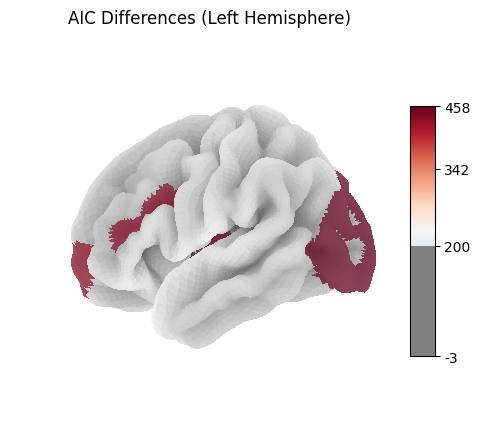

In [46]:
# Plot the data on the left hemisphere
plt.ioff()
plotting.plot_surf_roi(fsaverage.pial_left, roi_map=left_surf_data,
                       cmap='RdBu_r', colorbar=True, view='lateral',
                       bg_map=fsaverage.sulc_left, bg_on_data=True, threshold=200,
                       title='AIC Differences (Left Hemisphere)')
plt.show()

2024-08-26 13:38:10,388 - DEBUG - locator: <matplotlib.ticker.FixedLocator object at 0x7f26044d5e20>


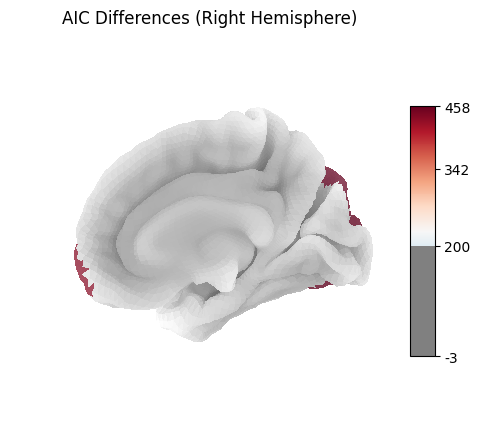

In [47]:
# Plot the data on the right hemisphere
plt.ioff()
plotting.plot_surf_roi(fsaverage.pial_right, roi_map=right_surf_data,
                       cmap='RdBu_r', colorbar=True, view='lateral',
                       bg_map=fsaverage.sulc_right, bg_on_data=True, threshold=200,
                       title='AIC Differences (Right Hemisphere)')
plt.show()

In [48]:
plt.ion()
plotting.view_surf(fsaverage.pial_left, surf_map=left_surf_data,
                                       cmap='RdBu_r', colorbar=True,
                                       bg_map=fsaverage.sulc_left, bg_on_data=True, threshold=200,
                                       title='AIC Differences (Left Hemisphere)')


#### Loading Saved GAMLSS Models

To load a saved GAMLSS model:

1. Specify the `main_folder` where your results are stored.
2. The models are saved in `{main_folder}/model_cache/saved_models/`.
3. Models are named as `"model_{y_val}_{model_type}.rds`.
   - `y_val`: The outcome variable name
   - `model_type`: Either 'base' or 'target'

Use the `Gamlss.load_model()` method to load the desired model.



In [49]:
## Example code to load a saved model

# Change the things here if needed
main_folder = r"../results/model_comparison" # Adjust this to your main results folder
y_val = "y_thickness1"  # Replace with your outcome variable
model_type = "base"  # Choose 'base' or 'target'

# Here you dont need to change
model_name = f"model_{y_val}_{model_type}"
model_path = os.path.join(main_folder, "model_cache", "saved_models", f"{model_name}.rds")
loaded_model = Gamlss.load_model(model_path)

Model 'model_y_thickness1_base' loaded from ../results/model_comparison/model_cache/saved_models/model_y_thickness1_base.rds


In [50]:
# Now your model is ready to use and here is one example to say get the z_score
z_scores = loaded_model.z_score(train_data1,train_data1, func_name = 'SHASH')
print('Z-score:', z_scores)

Z-score: [-1.54242     0.60809467 -0.9003639  ...  1.3652702  -0.39090487
 -1.56589728]


### Running Models with Permutation Tests

The `run_models_with_permutation` function allows you to fit GAMLSS models and perform permutation tests to assess the significance of additional features in the target model compared to the base model.

#### Function Parameters:

- `create_model_func`: Function to create a GAMLSS model
- `y_val`: Name of the y-value column to model
- `df_train`: Training dataframe
- `additional_features`: Additional features to include in the target model
- `base_formula`: Dictionary specifying the base model formula
- `target_formula`: Dictionary specifying the target model formula
- `x_vals`: List of predictor variables (default: ['age', 'sex', 'site'])
- `main_folder`: Folder for saving results and logs (default: 'results')
- `save_log`: Whether to save logs (default: True)
- `num_permutations`: Number of permutations to perform (default: 1000)
- `force_overwrite`: Whether to overwrite existing cached results (default: False)
- `save_models`: Whether to save fitted models (default: False)


#### Function Outputs:

The function returns a dictionary containing:

1. `base_model`: The fitted base model
2. `target_model`: The fitted target model
3. `aic_diff`: AIC difference between base and target models
4. `bic_diff`: BIC difference between base and target models
5. `permutation_results`: DataFrame with AIC and BIC differences for each permutation
6. `p_value_aic`: P-value based on AIC differences
7. `p_value_bic`: P-value based on BIC differences

#### Permutation Test Process:

1. Fits the base and target models on the original data.
2. Calculates the original AIC and BIC differences.
3. Performs multiple permutations:
   - Randomly shuffles the additional features.
   - Fits the target model on the permuted data.
   - Calculates AIC and BIC differences for each permutation.
4. Computes p-values by comparing the original differences to the permuted differences.

#### To interpret the results:

- Lower AIC/BIC values indicate better model fit.
- Positive AIC/BIC differences (base - target) suggest the target model is better.
- P-values indicate the probability of observing the actual AIC/BIC difference (or a more extreme one) under the null hypothesis of no effect from additional features.
- A low p-value (typically < 0.05) suggests that the additional features in the target model significantly improve the fit compared to the base model.

This function helps in rigorously assessing whether the additional features in the target model provide a statistically significant improvement over the base model, using permutation tests to establish the significance of the observed differences in model fit.

In [11]:
# This function gives us the flexibility on what we want to change and what we want to keep constant
# For example, we can keep the nu and tau formula fixed by removing it from this creat_model_func and in the next cell we can
# just change the other parameters or even change the way we want to input

def create_model_func(model_name, x_vals, y_val, mu_formula, sigma_formula, nu_formula, tau_formula):
    def model_func(data):
        gamlss_model = Gamlss(model_name, x_vals, y_val)
        gamlss_model.fit(
            r_code=f"""
            model <- gamlss(
                y ~ {mu_formula},
                sigma.formula = ~ {sigma_formula},
                nu.formula = ~ {nu_formula},
                tau.formula = ~ {tau_formula},
                random = ~ 1|site,
                family = SHASH(),
                method = RS(10)
            )
            """,
            data=data
        )
        return gamlss_model
    return model_func


In [12]:
train_data1.columns

Index(['site', 'sex', 'age', 'feature_volume1', 'feature_volume2',
       'feature_volume3', 'feature_volume4', 'feature_volume5', 'y_thickness1',
       'y_thickness2', 'y_thickness3', 'y_thickness4'],
      dtype='object')

In [19]:
#### Preparing the input
main_folder = r'../results/permutation_test'
num_cores = mp.cpu_count()  # Get the number of CPU cores
y_val_columns = ['y_thickness1','y_thickness2', 'y_thickness3', 'y_thickness4']
additional_features =  ['feature_volume1', 'feature_volume2']

# Formula's for baseline and target
base_formula = {'mu_formula': 'pb(age, by = as.factor(sex))',
                'sigma_formula': 'pb(age) + site',
                'nu_formula': '1',
                'tau_formula': '1'}

target_formula = {'mu_formula': 'pb(age, by = as.factor(sex)) + site + feature_volume1 + feature_volume2',
                'sigma_formula': 'pb(age)+ site',
                'nu_formula': '1',
                'tau_formula': '1'}


print(f"Number of CPU cores: {num_cores}")


Number of CPU cores: 16


In [24]:
# Usage example:
permutation_results = run_models_with_permutation(
    create_model_func=create_model_func,
    y_val_columns=y_val_columns,
    df_train=train_data1,
    additional_features=additional_features,
    base_formula=base_formula,
    target_formula=target_formula,
    x_vals=['age', 'sex', 'site'],
    main_folder=main_folder,
    save_log=True,
    num_cores=8,
    force_overwrite=True,
    n_permutations=2,  # Set to None to skip permutation testing
    random_seed=0,  # Set a random seed for reproducibility
    use_multiprocessing = False,
    save_models= True
)

2024-10-02 17:20:01,074 - INFO - Main folder: ../results/permutation_test
2024-10-02 17:20:01,075 - INFO - Cache folder: ../results/permutation_test/model_cache
2024-10-02 17:20:01,075 - INFO - Log folder: ../results/permutation_test/model_logs
2024-10-02 17:20:01,075 - INFO - Using 8 CPU cores
2024-10-02 17:20:01,076 - INFO - Using random seed: 0
2024-10-02 17:20:06,507 - INFO - Generated 2 permutation seeds


Processing y_val columns:   0%|          | 0/4 [00:00<?, ?it/s]

2024-10-02 17:20:06,509 - INFO - Processing permutation for y_thickness1
2024-10-02 17:20:06,509 - INFO - Starting permutation test for y_thickness1 with 2 permutations
GAMLSS-RS iteration 1: Global Deviance = 3539.037 
GAMLSS-RS iteration 2: Global Deviance = 3455.485 
GAMLSS-RS iteration 3: Global Deviance = 3394.778 
GAMLSS-RS iteration 4: Global Deviance = 3348.836 
GAMLSS-RS iteration 5: Global Deviance = 3313.009 
GAMLSS-RS iteration 6: Global Deviance = 3283.89 
GAMLSS-RS iteration 7: Global Deviance = 3260.307 
GAMLSS-RS iteration 8: Global Deviance = 3240.753 
GAMLSS-RS iteration 9: Global Deviance = 3224.351 
GAMLSS-RS iteration 10: Global Deviance = 3210.45 
GAMLSS-RS iteration 1: Global Deviance = -1503.646 
GAMLSS-RS iteration 2: Global Deviance = -1539.076 
GAMLSS-RS iteration 3: Global Deviance = -1560.026 
GAMLSS-RS iteration 4: Global Deviance = -1575.189 
GAMLSS-RS iteration 5: Global Deviance = -1586.327 
GAMLSS-RS iteration 6: Global Deviance = -1594.915 
GAMLSS-RS 

Processing y_val columns:  25%|██▌       | 1/4 [00:23<01:09, 23.27s/it]

2024-10-02 17:20:29,776 - INFO - Processing permutation for y_thickness2
2024-10-02 17:20:29,777 - INFO - Starting permutation test for y_thickness2 with 2 permutations
GAMLSS-RS iteration 1: Global Deviance = 3547.814 
GAMLSS-RS iteration 2: Global Deviance = 3469.479 
GAMLSS-RS iteration 3: Global Deviance = 3411.08 
GAMLSS-RS iteration 4: Global Deviance = 3371.266 
GAMLSS-RS iteration 5: Global Deviance = 3336.058 
GAMLSS-RS iteration 6: Global Deviance = 3306.161 
GAMLSS-RS iteration 7: Global Deviance = 3281.777 
GAMLSS-RS iteration 8: Global Deviance = 3261.573 
GAMLSS-RS iteration 9: Global Deviance = 3244.596 
GAMLSS-RS iteration 10: Global Deviance = 3230.061 
GAMLSS-RS iteration 1: Global Deviance = -1528.409 
GAMLSS-RS iteration 2: Global Deviance = -1560.649 
GAMLSS-RS iteration 3: Global Deviance = -1584.929 
GAMLSS-RS iteration 4: Global Deviance = -1603.056 
GAMLSS-RS iteration 5: Global Deviance = -1616.844 
GAMLSS-RS iteration 6: Global Deviance = -1627.378 
GAMLSS-RS

Processing y_val columns:  50%|█████     | 2/4 [01:01<01:04, 32.13s/it]

2024-10-02 17:21:08,116 - INFO - Processing permutation for y_thickness3
2024-10-02 17:21:08,117 - INFO - Starting permutation test for y_thickness3 with 2 permutations
GAMLSS-RS iteration 1: Global Deviance = 4172.668 
GAMLSS-RS iteration 2: Global Deviance = 4120.57 
GAMLSS-RS iteration 3: Global Deviance = 4083.151 
GAMLSS-RS iteration 4: Global Deviance = 4055.325 
GAMLSS-RS iteration 5: Global Deviance = 4034.14 
GAMLSS-RS iteration 6: Global Deviance = 4017.507 
GAMLSS-RS iteration 7: Global Deviance = 4004.271 
GAMLSS-RS iteration 8: Global Deviance = 3993.825 
GAMLSS-RS iteration 9: Global Deviance = 3985.247 
GAMLSS-RS iteration 10: Global Deviance = 3977.997 
GAMLSS-RS iteration 1: Global Deviance = 4166.467 
GAMLSS-RS iteration 2: Global Deviance = 4115.287 
GAMLSS-RS iteration 3: Global Deviance = 4077.923 
GAMLSS-RS iteration 4: Global Deviance = 4049.863 
GAMLSS-RS iteration 5: Global Deviance = 4028.236 
GAMLSS-RS iteration 6: Global Deviance = 4011.344 
GAMLSS-RS iterat

Processing y_val columns:  75%|███████▌  | 3/4 [01:54<00:41, 41.60s/it]

2024-10-02 17:22:01,009 - INFO - Processing permutation for y_thickness4
2024-10-02 17:22:01,009 - INFO - Starting permutation test for y_thickness4 with 2 permutations
GAMLSS-RS iteration 1: Global Deviance = 3596.386 
GAMLSS-RS iteration 2: Global Deviance = 3504.663 
GAMLSS-RS iteration 3: Global Deviance = 3437.873 
GAMLSS-RS iteration 4: Global Deviance = 3387.546 
GAMLSS-RS iteration 5: Global Deviance = 3348.459 
GAMLSS-RS iteration 6: Global Deviance = 3317.296 
GAMLSS-RS iteration 7: Global Deviance = 3292.048 
GAMLSS-RS iteration 8: Global Deviance = 3271.35 
GAMLSS-RS iteration 9: Global Deviance = 3253.905 
GAMLSS-RS iteration 10: Global Deviance = 3239.273 
GAMLSS-RS iteration 1: Global Deviance = 3587.268 
GAMLSS-RS iteration 2: Global Deviance = 3503.96 
GAMLSS-RS iteration 3: Global Deviance = 3439.739 
GAMLSS-RS iteration 4: Global Deviance = 3390.477 
GAMLSS-RS iteration 5: Global Deviance = 3351.56 
GAMLSS-RS iteration 6: Global Deviance = 3320.368 
GAMLSS-RS iterati

Processing y_val columns: 100%|██████████| 4/4 [02:13<00:00, 33.35s/it]

2024-10-02 17:22:20,113 - INFO - Saved permutation results to ../results/permutation_test/permutation_results.csv


In [25]:
permutation_results

,y_val,Unshuffled AIC_target,Unshuffled AIC_base,Unshuffled AIC_diff,Unshuffled BIC_diff,Permuted AIC_diff,Permuted BIC_diff,P-value (AIC),P-value (BIC),Convergence Rate
0,y_thickness1,-1569.172889,3236.457059,4805.629948,4760.291557,"[-13.360877332238942, -8.173910260779394]","[-57.79685924637124, -52.60963581329679]",0.0,0.0,"[0.0, 0.0]"
1,y_thickness2,-1607.552686,3257.461374,4865.01406,4823.060529,"[-7.816032694191563, -13.723597819908264]","[-52.25183825861177, -58.99103430908235]",0.0,0.0,"[0.0, 0.0]"
2,y_thickness3,4014.707707,4004.002831,-10.704876,-55.1406,"[-17.351747853139386, -13.87965644103042]","[-61.787607928184116, -58.31540882783065]",0.0,0.0,"[0.0, 0.0]"
3,y_thickness4,3286.513919,3266.767836,-19.746083,-64.869058,"[-15.628236261323309, -9.110920328834254]","[-59.81280561385756, -53.546719396196295]",1.0,1.0,"[0.0, 0.0]"


### Loading and visualizing the data

In [67]:
# Re-loading the saved files
main_folder = r"../results/permutation_test"

permutation_results = pd.read_csv(os.path.join(main_folder, "permutation_results.csv"))

permutation_results = convert_string_to_list(permutation_results, column_names= ["Permuted AIC_diff", "Permuted BIC_diff"])

#### Optional Pre-processing: In case want to change the names of the y_val variable to match the atlas
**NOTE**: The plotting code is robust enough to detect the similar names, so use this function only if the names of features are very different from that of atlas. Otherwise you can just skip this step

In [68]:

# Example usage:
old_names = ['y_thickness1', 'y_thickness2', 'y_thickness3', 'y_thickness4']
new_names = ['lh_G_S_frontomargin_thickness', 'lh_G_S_occipital_inf_thickness', 'lh_G_S_paracentral_thickness', 'lh_G_S_subcentral_thickness']

permutation_results = rename_y_vals(permutation_results, old_names, new_names)

In [69]:
permutation_results.y_val

0     lh_G_S_frontomargin_thickness
1    lh_G_S_occipital_inf_thickness
2      lh_G_S_paracentral_thickness
3       lh_G_S_subcentral_thickness
Name: y_val, dtype: object

In [70]:
permutation_results

,y_val,y_val.1,Unshuffled AIC_target,Unshuffled AIC_base,Unshuffled AIC_diff,Unshuffled BIC_diff,Permuted AIC_diff,Permuted BIC_diff,P-value (AIC),P-value (BIC),Convergence Rate
0,lh_G_S_frontomargin_thickness,y_thickness1,-1569.172889,3236.457059,4805.629948,4760.291557,"[-9.768226402745313, -6.698409313492448]","[-54.20388381834164, -51.134217247773904]",0.0,0.0,"[0.0, 0.0]"
1,lh_G_S_occipital_inf_thickness,y_thickness2,-1607.552686,3257.461374,4865.014060,4823.060529,"[-11.697000361531082, -17.69833335156818]","[-56.1327491445054, -62.134013903660616]",0.0,0.0,"[0.0, 0.0]"
2,lh_G_S_paracentral_thickness,y_thickness3,4014.707707,4004.002831,-10.704876,-55.140600,"[-11.227312874680138, 11.151295082613615]","[-55.66322488430433, -33.284797739638634]",0.5,0.5,"[0.0, 0.0]"
3,lh_G_S_subcentral_thickness,y_thickness4,3286.513919,3266.767836,-19.746083,-64.869058,"[-13.678627303377198, -9.487296735599557]","[-58.11441036431643, -53.92321310266925]",1.0,1.0,"[0.0, 0.0]"


In [71]:
sorted_df = permutation_results.sort_values(by='P-value (AIC)', ascending=True)
sorted_df = sorted_df.reset_index(drop=True)
sorted_df

,y_val,y_val.1,Unshuffled AIC_target,Unshuffled AIC_base,Unshuffled AIC_diff,Unshuffled BIC_diff,Permuted AIC_diff,Permuted BIC_diff,P-value (AIC),P-value (BIC),Convergence Rate
0,lh_G_S_frontomargin_thickness,y_thickness1,-1569.172889,3236.457059,4805.629948,4760.291557,"[-9.768226402745313, -6.698409313492448]","[-54.20388381834164, -51.134217247773904]",0.0,0.0,"[0.0, 0.0]"
1,lh_G_S_occipital_inf_thickness,y_thickness2,-1607.552686,3257.461374,4865.014060,4823.060529,"[-11.697000361531082, -17.69833335156818]","[-56.1327491445054, -62.134013903660616]",0.0,0.0,"[0.0, 0.0]"
2,lh_G_S_paracentral_thickness,y_thickness3,4014.707707,4004.002831,-10.704876,-55.140600,"[-11.227312874680138, 11.151295082613615]","[-55.66322488430433, -33.284797739638634]",0.5,0.5,"[0.0, 0.0]"
3,lh_G_S_subcentral_thickness,y_thickness4,3286.513919,3266.767836,-19.746083,-64.869058,"[-13.678627303377198, -9.487296735599557]","[-58.11441036431643, -53.92321310266925]",1.0,1.0,"[0.0, 0.0]"


In [72]:
# This will look for the closest match in the atlas and assign the name of the region in the atlas to the region in the dataframe
## Important Note: Choose the 'surf' atlas not the other one
## For example for below case, choose `fetch_atlas_surf_destrieux` not `fetch_atlas_destrieux_2009`

atlas = datasets.fetch_atlas_surf_destrieux()
closest_match_df,left_surf_data, right_surf_data = match_regions(permutation_results, atlas=atlas, column='P-value (AIC)', region_column='y_val')
closest_match_df.iloc[:,-1] = 1 - closest_match_df.iloc[:,-1]
closest_match_df


,Region,Closest_Match,Similarity_Score,P-value (AIC)
0,L G_and_S_occipital_inf,lh_G_S_occipital_inf_thickness,0.641509,1.0
1,L G_and_S_frontomargin,lh_G_S_frontomargin_thickness,0.627451,1.0
2,L G_and_S_paracentral,lh_G_S_paracentral_thickness,0.612245,0.5
3,L G_and_S_subcentral,lh_G_S_subcentral_thickness,0.595745,0.0


#### Visualizing the data

In [73]:
# Load the fsaverage5 surface
from nilearn import plotting, datasets
plt.ion()
fsaverage = datasets.fetch_surf_fsaverage()

view = plotting.view_surf(fsaverage.pial_left, surf_map=left_surf_data,
                                       cmap='RdBu_r', colorbar=True,
                                       bg_map=fsaverage.sulc_left, bg_on_data=True,threshold=0.05,
                                       title='1-pval (Left Hemisphere)')
display(view)


2024-08-26 14:29:51,512 - DEBUG - locator: <matplotlib.ticker.FixedLocator object at 0x7f25b5dd3a40>


/home/nitin01/anaconda3/envs/nitinenv/lib/python3.12/site-packages/nilearn/plotting/surf_plotting.py:439: UserWarning: You provided a non integer threshold but configured the colorbar to use integer formatting.
  warn("You provided a non integer threshold "


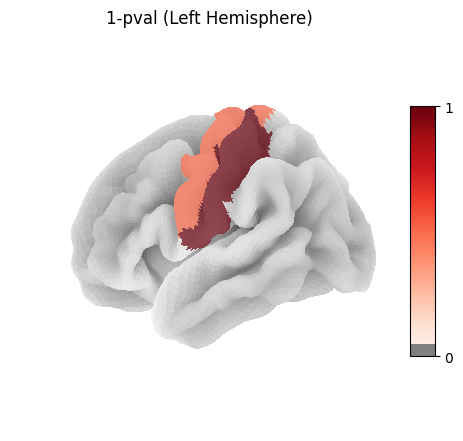

In [74]:
# Plot the data on the left hemisphere
plt.ioff()
plotting.plot_surf_roi(fsaverage.pial_left, roi_map=left_surf_data,
                       cmap='Reds', colorbar=True, view='lateral',
                       bg_map=fsaverage.sulc_left, bg_on_data=True, vmin=0, vmax=1, threshold=0.05,
                       title='1-pval (Left Hemisphere)')
plt.show()

2024-08-26 14:29:53,476 - DEBUG - locator: <matplotlib.ticker.FixedLocator object at 0x7f25bc452660>


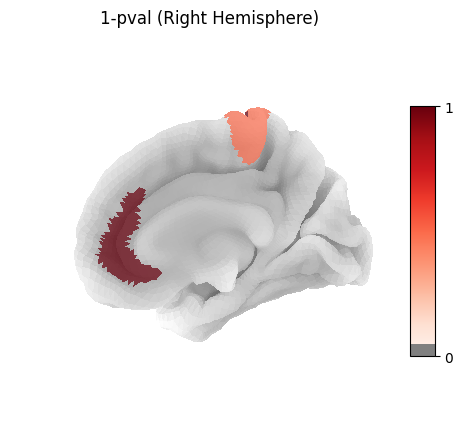

In [75]:
# Plot the data on the right hemisphere
plt.ioff()
plotting.plot_surf_roi(fsaverage.pial_right, roi_map=right_surf_data,
                       cmap='Reds', colorbar=True, view='lateral',
                       bg_map=fsaverage.sulc_right, bg_on_data=True, vmin=0, vmax=1, threshold=0.05,
                       title='1-pval (Right Hemisphere)')
plt.show()

In [76]:
plt.ion()
plotting.view_surf(fsaverage.pial_left, surf_map=left_surf_data,
                                       cmap='RdBu_r', colorbar=True,
                                       bg_map=fsaverage.sulc_left, bg_on_data=True, threshold=0.05,
                                       title='1-pval (Left Hemisphere)')
display(view)

#### Steps to Load and Compare Models:

1. Set your `main_folder` where results are stored.
2. Choose the `y_val` (outcome variable) you're interested in.
3. Use `get_permutation_seeds()` to view available permutation seeds.
4. Load the main (non-permuted) model using `load_gamlss_model()` without specifying a seed.
5. Load permuted models by specifying a seed from the available seeds.

#### Notes:
- Models are stored in `{main_folder}/model_cache/saved_models/`.
- Non-permuted models are named `"model_{y_val}_{model_type}_unshuffled.rds"`.
- Permuted models are named `"model_{y_val}_{model_type}_perm_{seed}.rds"`.
- Always check if the model file exists before attempting to load it.
- You can compare the main model with permuted models to assess the significance of your findings.

This approach allows you to easily view available permutation seeds and load specific models for further analysis or comparison.

In [77]:
#### Viewing Available Permutation Seeds
####To view the available permutation seeds for a specific model:

# Example usage
main_folder = r'../results/permutation_test'
y_val = 'y_thickness1'
seeds = get_permutation_seeds(main_folder, y_val)
print(f"Available seeds for {y_val}: {seeds}")

Available seeds for y_thickness1: [21243, 42613, 43567, 45891, 68268]


In [78]:
def load_gamlss_model(main_folder, y_val, model_type='target', seed=None):
    model_dir = os.path.join(main_folder, 'model_cache', 'saved_models')
    
    if seed is None:
        model_file = f"model_{y_val}_{model_type}_unshuffled.rds"
    else:
        model_file = f"model_{y_val}_{model_type}_perm_{seed}.rds"
    
    model_path = os.path.join(model_dir, model_file)
    
    if not os.path.exists(model_path):
        raise FileNotFoundError(f"Model file not found: {model_path}")
    
    return Gamlss.load_model(model_path)

In [79]:
#### To load a saved GAMLSS model:
model_type = 'target'

# Load the main model (non-permuted)
main_model = load_gamlss_model(main_folder, y_val, model_type)

# Load a permuted model
seed = seeds[0]  # Choose a seed from the available seeds
permuted_model = load_gamlss_model(main_folder, y_val, model_type, seed)

Model 'model_y_thickness1_target_unshuffled' loaded from ../results/permutation_test/model_cache/saved_models/model_y_thickness1_target_unshuffled.rds
Model 'model_y_thickness1_target_perm_21243' loaded from ../results/permutation_test/model_cache/saved_models/model_y_thickness1_target_perm_21243.rds


In [80]:

# Now your model is ready to use and here is one example to say get the z_score
z_scores = permuted_model.z_score(train_data1,train_data1, func_name = 'SHASH')
print('Z-score:', z_scores)

Z-score: [-0.89206218  1.14665428 -0.91085633 ...  1.92559211  0.35560315
 -0.24509001]


## Multisite Transfer for GAMLSS Models

The `multisite_transfer` function allows you to transfer a GAMLSS model trained on one site to multiple new sites, adjusting for potential differences between sites.

#### Function Parameters:

- `main_model_path`: Path to the main GAMLSS model
- `main_traindata`: Training dataset for the main model (pandas DataFrame)
- `df2`: Test dataset (pandas DataFrame)
- `new_sites`: List of new sites to transfer to
- `selected_sites`: Either a single string (proxy site) or a list of strings (same length as new_sites)
- `fractions`: Either a single float or a list of floats (same length as new_sites)
- `y_val`: Name of the target variable (string)
- `x_vals`: List of predictor variable names (list of strings)
- `iterations`: Number of iterations for the adjustment model (default: 100)
- `save_folder`: Folder path to save the results (string or None)
- `file_name`: File name to save the results (string or None)



#### Function Outputs:

The function returns a dictionary with each new site as a key. For each site, it provides:

1. `unadjusted_predictions`: Original predictions using the main model
2. `adjusted_predictions`: Predictions after site-specific adjustment
3. `z_scores`: Z-scores calculated from the adjusted predictions
4. `train_set_index`: Indices of samples used for training the adjustment model
5. `selected_site`: The proxy site used for transfer
6. `fraction`: Fraction of data used for adjustment

#### Site Transfer Process:

1. Loads the main GAMLSS model.
2. For each new site:
   - Prepares a subset of healthy samples from the new site.
   - Gets original predictions using the main model.
   - Fits an adjustment model using GAMLSS on the subset.
   - Applies the adjustments to the original predictions.
   - Calculates z-scores for the adjusted predictions.

#### Key Features:

- Handles multiple new sites in a single function call.
- Allows flexibility in specifying proxy sites and fractions for each new site.
- Optionally saves the results to a specified folder and file.

#### To interpret the results:

- Compare unadjusted and adjusted predictions to assess the impact of site transfer.
- Analyze z-scores to evaluate the quality of predictions after transfer.

This function is particularly useful in medical or biological contexts where data from different locations or centers need to be harmonized. It allows for the application of a model trained on one site to data from new sites, with site-specific adjustments to account for potential differences in data distributions across sites.

#### Creating data with outliers in the test domain to clearly demostrate the working of this function

In [10]:
# Function to generate random site ID
def generate_random_site_id(length, seed):
    random.seed(seed)
    letters = string.ascii_uppercase
    return ''.join(random.choice(letters) for _ in range(length))

# Generate train dataset
np.random.seed(42)
n_train = 1000
train_sites_seeds = [1, 2, 3, 4, 5]
train_sites = [generate_random_site_id(5, seed) for seed in train_sites_seeds]
age_train = np.random.randint(18, 80, n_train)
sex_train = np.random.choice([0, 1], size=n_train)
feature_volume_train1 = np.random.uniform(800, 1200, n_train)

y_thickness_train1 = 2 + 0.05 * age_train + 0.01 * feature_volume_train1 + 0.1 * sex_train + np.random.normal(0, 0.1, n_train)

train_data = {
    'site': np.random.choice(train_sites, size=n_train),
    'sex': sex_train,
    'age': age_train,
    'feature_volume1': feature_volume_train1,
    'y_thickness1': y_thickness_train1
}
train_data = pd.DataFrame(train_data)

# Generate test dataset
n_test = 800
np.random.seed(42)
test_sites_seeds = train_sites_seeds + [6, 7, 8, 9]  # Additional fixed seed for test site
test_sites = [generate_random_site_id(5, seed) for seed in test_sites_seeds]
new_site_bool = [test_site not in train_data['site'].unique() for test_site in test_sites]
new_site = np.array(test_sites)[new_site_bool]
print(f"New site: {new_site}")

age_test = np.random.randint(18, 80, n_test)
sex_test = np.random.choice([0, 1], size=n_test)
feature_volume_test1 = np.random.uniform(800, 1200, n_test)
site_test = np.random.choice(test_sites, size=n_test)

# Create y_thickness for test data
y_thickness_test1 = []
for i, test_site in enumerate(site_test):
    if test_site in train_data['site'].unique():
        y_thickness_test1.append(2 + 0.05 * age_test[i] + 0.01 * feature_volume_test1[i] + 0.1 * sex_test[i] + np.random.normal(0, 0.1))
    else:
        y_thickness_test1.append(5 + 0.05 * age_test[i] + 0.01 * feature_volume_test1[i] + 0.1 * sex_test[i] + np.random.normal(0, 0.3))

y_thickness_test1 = np.array(y_thickness_test1)
# Add outliers to the test data
morbidity_size = 200
outlier_indices = np.random.choice(n_test, size=morbidity_size, replace=False)
y_thickness_test1[outlier_indices[:(morbidity_size//2)]] += np.random.normal(3, 0.05, morbidity_size//2)  # Positive outliers for y_thickness1
y_thickness_test1[outlier_indices[(morbidity_size//2):]] -= np.random.normal(3, 0.001, morbidity_size//2)  # Negative outliers for y_thickness1

morbidities = ['None', 'Schizo', 'Dementia', 'MDD']
affected_test = np.full(n_test, 'None', dtype=object)
affected_test[outlier_indices] = np.random.choice(morbidities[1:], size=morbidity_size)  # Assign morbidities only to outliers



#affected_test = np.full(len(y_thickness_test1), 'None', dtype=object)

test_data = {
    'site': site_test,
    'sex': sex_test,
    'age': age_test,
    'feature_volume1': feature_volume_test1,
    'y_thickness1': y_thickness_test1,
    'affected': affected_test
}


df2 = pd.DataFrame(test_data)

# Print the datasets
print("Training Dataset:")
display(train_data.head())
print("\nTesting Dataset:")
display(df2.head())

# Print information about the new site
new_site_data = df2[df2['site'].isin(new_site)]
print(f"\nNew Site ({new_site}) Data:")
print(new_site_data.describe())

# Print information about the new site
print(f"\nTrain Sites Data:")
print(train_data.describe())

# Print unique sites
print("\nUnique sites in training data:", train_data['site'].unique())
print("Unique sites in testing data:", df2['site'].unique())

New site: ['ZSCPY' 'KEMUB' 'HLMEG' 'OTLIE']
Training Dataset:


,site,sex,age,feature_volume1,y_thickness1
0,ESZYC,0,56,848.209032,13.175779
1,ESZYC,0,69,1092.409469,16.387903
2,HJDXM,1,46,877.039611,13.144556
3,HJDXM,0,32,846.112808,12.153800
4,BCCLF,0,60,968.705064,14.735787



Testing Dataset:


,site,sex,age,feature_volume1,y_thickness1,affected
0,BCCLF,1,56,1043.157758,15.379592,None
1,ZSCPY,0,69,951.722279,18.786483,None
2,ESZYC,1,46,1097.699861,18.396045,MDD
3,HSREL,0,32,882.231923,9.405865,Schizo
4,BCCLF,0,60,1115.115955,16.073244,None



New Site (['ZSCPY' 'KEMUB' 'HLMEG' 'OTLIE']) Data:
              sex         age  feature_volume1  y_thickness1
count  350.000000  350.000000       350.000000    350.000000
mean     0.488571   49.491429      1003.921014     17.593706
std      0.500585   17.537800       113.941801      2.073066
min      0.000000   18.000000       800.095009     11.593685
25%      0.000000   37.000000       908.203552     16.212195
50%      0.000000   50.000000      1010.411119     17.764245
75%      1.000000   64.000000      1103.549995     19.055891
max      1.000000   79.000000      1199.741400     23.054111

Train Sites Data:
               sex          age  feature_volume1  y_thickness1
count  1000.000000  1000.000000      1000.000000   1000.000000
mean      0.477000    49.857000       997.722567     14.525074
std       0.499721    18.114267       114.789096      1.494410
min       0.000000    18.000000       800.095009     11.049746
25%       0.000000    35.000000       894.786788     13.420992
50

In [11]:
check_test_sites(train_data, df2)

Number of unique sites in the training set: 5
Number of unique sites in the test set: 9
Test sites not present in the training set: ['OTLIE', 'KEMUB', 'ZSCPY', 'HLMEG']
Number of extra sites: 4


,site,Length,Healthy,Morbidities
0,OTLIE,90,72,"Len: 18, ['MDD', 'Dementia', 'Schizo']"
1,KEMUB,80,61,"Len: 19, ['Schizo', 'Dementia', 'MDD']"
2,ZSCPY,89,60,"Len: 29, ['MDD', 'Schizo', 'Dementia']"
3,HLMEG,91,71,"Len: 20, ['MDD', 'Dementia', 'Schizo']"


Suggestion: Use 20% of 'None' samples from extra sites in the training data.
This can be done by calling the 'add_extra_site_data' function.


#### First we need the main model and save it
We will be using this model as our base model, utilized to be finetuned our data from new sites to be transferred

In [ ]:
# Defining x and y variables for GAMLASS
y_val = 'y_thickness1'
x_vals = ['age', 'sex', 'site']
columns = x_vals.copy()
columns.extend([y_val])

# Selecting the columns for the training data
df1 = train_data.loc[:, columns]

# Create an instance of the Gamlss class
model_name = 'main_model'
gamlss_model = Gamlss(model_name, x_vals, y_val)

gamlss_model.fit(
    r_code="""
    model <- gamlss(y ~ pb(age, by = as.factor(sex)) + site,
        sigma.formula = ~ pb(age) + site,
        nu.formula = ~ 1,
        tau.formula = ~ 1,
        random = ~ 1|site,
        family = SHASH(),
        method = RS(100)
    )
    """,
    data=df1
)

gamlss_model.save_model("../results/site_transfer_main_model.rds")

In [9]:
# Function for site transfer is imported from this file
from site_transfer_utils import *

In [12]:
# Setting up the code files
y_val = 'y_thickness1'
x_vals = ['age', 'sex', 'site']
columns = x_vals.copy()
columns.extend([y_val])

main_model_path = "../results/site_transfer_main_model.rds"
main_traindata = train_data.loc[:, columns]

new_sites = ['OTLIE', 'KEMUB', 'ZSCPY', 'HLMEG']
selected_sites = 'HJDXM' # or list of sites of same length as new_site
fractions=0.2 # or list of fractions of same length as new_site
iterations=50

# Saving the results
save_folder = "../results/site_transfer_results"
file_name = "multi_site_transfer_results.pkl"

In [13]:
results = multisite_transfer(main_model_path, main_traindata, df2, new_sites, selected_sites, fractions, y_val, x_vals, iterations, save_folder, file_name)

0it [00:00, ?it/s]

new_site: OTLIE, selected_site: HJDXM, fraction: 0.2
Model 'main_model' loaded from ../results/site_transfer_main_model.rds
Number of healthy samples in site OTLIE: 72/90
Samples used for training the adjustment model for site OTLIE: 14/90

GAMLSS-RS iteration 1: Global Deviance = 37.7674 
GAMLSS-RS iteration 2: Global Deviance = 37.7305 
GAMLSS-RS iteration 3: Global Deviance = 37.6841 
GAMLSS-RS iteration 4: Global Deviance = 37.6713 
GAMLSS-RS iteration 5: Global Deviance = 37.6596 
GAMLSS-RS iteration 6: Global Deviance = 37.65 
GAMLSS-RS iteration 7: Global Deviance = 37.6436 
GAMLSS-RS iteration 8: Global Deviance = 37.6387 
GAMLSS-RS iteration 9: Global Deviance = 37.6364 
GAMLSS-RS iteration 10: Global Deviance = 37.6339 
GAMLSS-RS iteration 11: Global Deviance = 37.6311 
GAMLSS-RS iteration 12: Global Deviance = 37.6302 
func_name: pSHASH


1it [00:01,  1.21s/it]

new_site: KEMUB, selected_site: HJDXM, fraction: 0.2
Model 'main_model' loaded from ../results/site_transfer_main_model.rds
Number of healthy samples in site KEMUB: 61/80
Samples used for training the adjustment model for site KEMUB: 12/80

GAMLSS-RS iteration 1: Global Deviance = 38.7902 
GAMLSS-RS iteration 2: Global Deviance = 37.6635 
GAMLSS-RS iteration 3: Global Deviance = 36.9877 
GAMLSS-RS iteration 4: Global Deviance = 36.4683 
GAMLSS-RS iteration 5: Global Deviance = 36.0309 
GAMLSS-RS iteration 6: Global Deviance = 35.6556 
GAMLSS-RS iteration 7: Global Deviance = 35.3392 
GAMLSS-RS iteration 8: Global Deviance = 35.0828 
GAMLSS-RS iteration 9: Global Deviance = 34.8434 
GAMLSS-RS iteration 10: Global Deviance = 34.6433 
GAMLSS-RS iteration 11: Global Deviance = 34.4614 
GAMLSS-RS iteration 12: Global Deviance = 34.2992 
GAMLSS-RS iteration 13: Global Deviance = 34.154 
GAMLSS-RS iteration 14: Global Deviance = 34.0152 
GAMLSS-RS iteration 15: Global Deviance = 33.8899 
GAML

2it [00:02,  1.29s/it]

new_site: ZSCPY, selected_site: HJDXM, fraction: 0.2
Model 'main_model' loaded from ../results/site_transfer_main_model.rds
Number of healthy samples in site ZSCPY: 60/89
Samples used for training the adjustment model for site ZSCPY: 12/89

GAMLSS-RS iteration 1: Global Deviance = 29.7816 
GAMLSS-RS iteration 2: Global Deviance = 29.7714 
GAMLSS-RS iteration 3: Global Deviance = 29.7522 
GAMLSS-RS iteration 4: Global Deviance = 29.7405 
GAMLSS-RS iteration 5: Global Deviance = 29.7351 
GAMLSS-RS iteration 6: Global Deviance = 29.7276 
GAMLSS-RS iteration 7: Global Deviance = 29.7225 
GAMLSS-RS iteration 8: Global Deviance = 29.7182 
GAMLSS-RS iteration 9: Global Deviance = 29.7161 
GAMLSS-RS iteration 10: Global Deviance = 29.7103 
GAMLSS-RS iteration 11: Global Deviance = 29.7088 
GAMLSS-RS iteration 12: Global Deviance = 29.7053 
GAMLSS-RS iteration 13: Global Deviance = 29.7043 
GAMLSS-RS iteration 14: Global Deviance = 29.6989 
GAMLSS-RS iteration 15: Global Deviance = 29.697 
GAML

3it [00:03,  1.22s/it]

func_name: pSHASH
new_site: HLMEG, selected_site: HJDXM, fraction: 0.2
Model 'main_model' loaded from ../results/site_transfer_main_model.rds
Number of healthy samples in site HLMEG: 71/91
Samples used for training the adjustment model for site HLMEG: 14/91

GAMLSS-RS iteration 1: Global Deviance = 52.6709 
GAMLSS-RS iteration 2: Global Deviance = 51.5982 
GAMLSS-RS iteration 3: Global Deviance = 50.8094 
GAMLSS-RS iteration 4: Global Deviance = 50.1635 
GAMLSS-RS iteration 5: Global Deviance = 49.6184 
GAMLSS-RS iteration 6: Global Deviance = 49.1667 
GAMLSS-RS iteration 7: Global Deviance = 48.7787 
GAMLSS-RS iteration 8: Global Deviance = 48.4455 
GAMLSS-RS iteration 9: Global Deviance = 48.1502 
GAMLSS-RS iteration 10: Global Deviance = 47.9019 
GAMLSS-RS iteration 11: Global Deviance = 47.6759 
GAMLSS-RS iteration 12: Global Deviance = 47.484 
GAMLSS-RS iteration 13: Global Deviance = 47.3046 
GAMLSS-RS iteration 14: Global Deviance = 47.1383 
GAMLSS-RS iteration 15: Global Devian

4it [00:05,  1.38s/it]

Results saved to ../results/site_transfer_results/multi_site_transfer_results.pkl


#### Verifying if the predictions has been adjusted or not
Please observe the mu value as while creating the data we set it to high and there we can see the change

In [26]:
# To access results for a specific site:
exp_site = 'ZSCPY'
exp_results = results[exp_site]
print(zscpy_results.keys())

dict_keys(['unadjusted_predictions', 'adjusted_predictions', 'z_scores', 'train_set_index', 'selected_site', 'fraction'])


In [27]:
exp_results['unadjusted_predictions']

,mu_pred,sigma_pred,nu_pred,tau_pred
1,15.486798,4.085762,3.077722,3.017594
2,14.813549,4.059222,3.077722,3.017594
3,12.897453,3.981903,3.077722,3.017594
4,13.415312,4.002913,3.077722,3.017594
5,15.797534,4.097927,3.077722,3.017594
...,...,...,...,...
85,13.829599,4.019701,3.077722,3.017594
86,15.279643,4.077635,3.077722,3.017594
87,14.088529,4.030160,3.077722,3.017594
88,13.777813,4.017606,3.077722,3.017594


In [28]:
exp_results['adjusted_predictions']

,mu_pred,sigma_pred,nu_pred,tau_pred
1,18.508949,4.130451,3.215768,3.175277
2,17.835699,4.103910,3.215768,3.175277
3,15.919603,4.026592,3.215768,3.175277
4,16.437462,4.047602,3.215768,3.175277
5,18.819684,4.142616,3.215768,3.175277
...,...,...,...,...
85,16.851749,4.064390,3.215768,3.175277
86,18.301793,4.122324,3.215768,3.175277
87,17.110679,4.074849,3.215768,3.175277
88,16.799963,4.062294,3.215768,3.175277


#### We can also plot the z score as follows

In [29]:
site_df2 = df2[df2['site'] == exp_site]

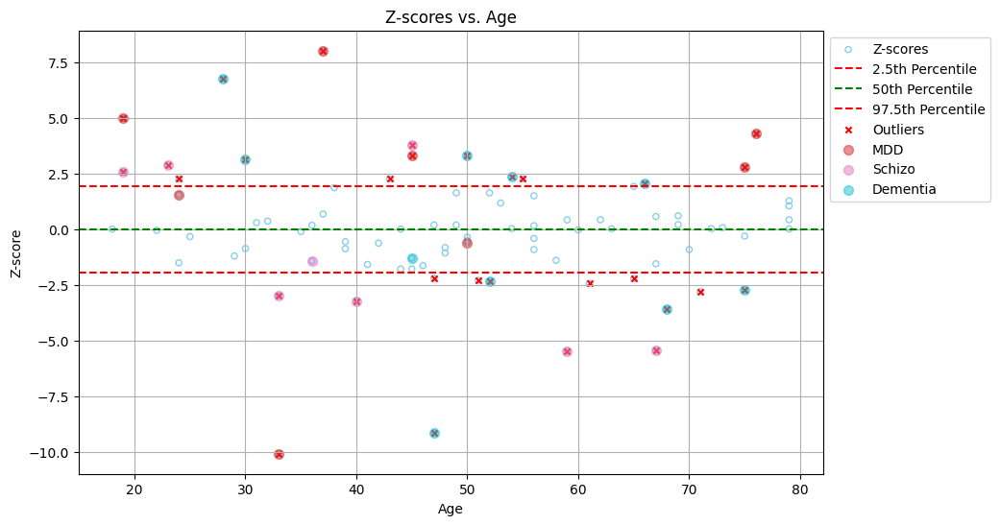

In [30]:
plot_z_scores_site(exmp_results['z_scores'], site_df2, affected=site_df2['affected'])